# 🪐 Crater Segmentation — Multi-Model Notebook

**Project:** CS776 — Deep Learning for Computer Vision, IIT Kanpur

**Models included:**

| Key | Architecture | Description |
|---|---|---|
| `rdt_unet_plusplus` | RDT-UNet++ | Novel: Dilated-Residual-Dense encoder + Window/Cross-scale/Circular Transformer skips + MSF head |
| `swin_crater_net` | SwinCraterNet | Pretrained Swin-T encoder + ASPP bottleneck + Dilated Residual decoder + MSF head |
| `mia_unet` | Multiscale Inception Attention UNet | Multi-scale inception encoder + Spatial Focus Gate decoder + deep supervision |
| `ghost_eca_mlp` | Ghost ECA MLP | Ghost convolutions + ECA channel attention + SegFormer-style MLP decoder |

**Plug-and-play usage:** Change `MODEL_NAME` in Section 0 to any key above, then Restart & Run All.


## Section 0 — Global Config

> **Change `MODEL_NAME` here to switch models.**  
> Options: `'rdt_unet_plusplus'` | `'swin_crater_net'` | `'mia_unet'` | `'ghost_eca_mlp'`

In [1]:
import os
os.environ['PYTORCH_ALLOC_CONF'] = 'expandable_segments:True'  # reduces fragmentation

# ╔══════════════════════════════════════════════════════════════╗
# ║  ▶  CHANGE THIS to switch models — then Restart & Run All  ║
# ║     Options:                                                ║
# ║       'rdt_unet_plusplus'  — Novel RDT-UNet++               ║
# ║       'swin_crater_net'    — Pretrained Swin-T encoder      ║
# ║       'mia_unet'          — Multiscale Inception Attn UNet ║
# ║       'ghost_eca_mlp'      — Ghost ECA MLP SegNet          ║
# ╚══════════════════════════════════════════════════════════════╝
MODEL_NAME         = 'swin_crater_net'
HOLDOUT_IMAGE_NAME = 'thm_dir_N00_330.png'   # ← reserved hold-out image

print(f'Model          : {MODEL_NAME}')
print(f'Hold-out image : {HOLDOUT_IMAGE_NAME}')


Model          : swin_crater_net
Hold-out image : thm_dir_N00_330.png


## Section 1 — Setup & Imports

In [2]:
# Install dependencies (run once)
!pip install torch torchvision opencv-python tqdm matplotlib numpy --quiet

# SwinCraterNet requires timm for pretrained Swin-T backbone
!pip install timm --quiet


In [3]:
import os, sys, json, time, random, shutil, math, warnings
from pathlib import Path
from datetime import datetime
from dataclasses import dataclass, field
from typing import Dict, List, Optional, Tuple

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from torchvision.models import resnet50, ResNet50_Weights
from torch.cuda.amp import GradScaler, autocast

warnings.filterwarnings('ignore')

DEVICE  = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
USE_AMP = torch.cuda.is_available()

print(f'✓ Device    : {DEVICE}')
print(f'✓ PyTorch   : {torch.__version__}')
print(f'✓ CUDA      : {torch.cuda.is_available()}')
print(f'✓ AMP (fp16): {USE_AMP}')
print(f'✓ Model     : {MODEL_NAME}')

# timm — needed only for swin_crater_net, silently installed if missing
try:
    import timm
    print(f'✓ timm      : {timm.__version__}')
except ImportError:
    import subprocess; subprocess.run(['pip', 'install', 'timm', '-q'])
    import timm
    print(f'✓ timm installed: {timm.__version__}')


✓ Device    : cuda
✓ PyTorch   : 2.10.0+cu128
✓ CUDA      : True
✓ AMP (fp16): True
✓ Model     : swin_crater_net
✓ timm      : 1.0.25


In [4]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False

set_seed(42)
print('✓ Seed set to 42')


✓ Seed set to 42


## Section 2 — Training Configuration

Per-model hyperparameters are applied automatically when you select `MODEL_NAME`.

In [5]:
@dataclass
class TrainConfig:
    tile_image_dir     : str   = './tiles/images'
    tile_mask_dir      : str   = './tiles/masks'
    holdout_image_dir  : str   = './tiles_holdout/images'
    holdout_mask_dir   : str   = './tiles_holdout/masks'
    output_dir         : str   = './runs'
    train_ratio        : float = 0.70
    val_ratio          : float = 0.15
    epochs             : int   = 35
    batch_size         : int   = 4
    learning_rate      : float = 1e-4
    weight_decay       : float = 1e-5
    early_stop_patience: int   = 10
    num_workers        : int   = 2
    pin_memory         : bool  = True
    bce_weight         : float = 0.5
    dice_weight        : float = 0.5
    pos_weight         : float = 10.0
    in_channels        : int   = 1
    out_channels       : int   = 1
    seed               : int   = 42
    model_name         : str   = MODEL_NAME

# Per-model hyperparameter overrides
_MODEL_HPARAMS = {
    'rdt_unet_plusplus': dict(epochs=25, batch_size=4, learning_rate=1e-4,  weight_decay=1e-5,  early_stop_patience=10),
    'swin_crater_net'  : dict(epochs=35, batch_size=4, learning_rate=5e-5,  weight_decay=1e-4,  early_stop_patience=10),
    'mia_unet'        : dict(epochs=25, batch_size=4, learning_rate=1e-4,  weight_decay=1e-5,  early_stop_patience=10),
    'ghost_eca_mlp'    : dict(epochs=25, batch_size=4, learning_rate=1e-4,  weight_decay=1e-5,  early_stop_patience=10),
}

CFG = TrainConfig()
for k, v in _MODEL_HPARAMS.get(MODEL_NAME, {}).items():
    setattr(CFG, k, v)
CFG.model_name = MODEL_NAME

print(f'✓ Config loaded  →  model={CFG.model_name}')
print(f'   epochs={CFG.epochs}  batch={CFG.batch_size}  lr={CFG.learning_rate}  wd={CFG.weight_decay}')


✓ Config loaded  →  model=swin_crater_net
   epochs=35  batch=4  lr=5e-05  wd=0.0001


## Section 3 — Tiling + Copy-Paste Augmentation

Two-pass tiling:
- **Pass 1:** 23 training images → `./tiles/` with copy-paste augmentation
- **Pass 2:** 1 hold-out image   → `./tiles_holdout/` (no augmentation)

> Skip these cells if tiles already exist on disk.


In [6]:
IMAGE_DIR                = r"/kaggle/input/datasets/sahibjparmar/mars-crater-dataset-for-semantic-segmentation/Dataset/Images"
MASK_DIR                 = r"/kaggle/input/datasets/sahibjparmar/mars-crater-dataset-for-semantic-segmentation/Dataset/Mars_Crater_Segmentation_Dataset_02-32_km_radius/edge_thicker"
OUTPUT_IMAGE_DIR         = './tiles/images'
OUTPUT_MASK_DIR          = './tiles/masks'
OUTPUT_HOLDOUT_IMAGE_DIR = './tiles_holdout/images'
OUTPUT_HOLDOUT_MASK_DIR  = './tiles_holdout/masks'

TILE_SIZE             = 512
STRIDE                = 512
ENABLE_COPY_PASTE     = True
PASTES_PER_IMAGE      = 3
AUGMENTED_COPIES      = 2
MIN_CRATER_PIXELS     = 30
BLEND_FEATHER_RADIUS  = 5
MAX_PASTE_ATTEMPTS    = 10
BLACK_STRIP_THRESHOLD = 0.15
BLACK_PIXEL_VALUE     = 10

for d in [OUTPUT_IMAGE_DIR, OUTPUT_MASK_DIR, OUTPUT_HOLDOUT_IMAGE_DIR, OUTPUT_HOLDOUT_MASK_DIR]:
    os.makedirs(d, exist_ok=True)
print('✓ Directories ready')


✓ Directories ready


In [7]:
# ── Artifact Detection ────────────────────────────────────────────────────────
def has_black_strip(image: np.ndarray, threshold=BLACK_STRIP_THRESHOLD) -> bool:
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.ndim == 3 else image
    return (gray < BLACK_PIXEL_VALUE).sum() / gray.size > threshold

# ── Crater Instance Library ───────────────────────────────────────────────────
class CraterLibrary:
    def __init__(self):
        self.craters = []

    def extract_from_tile(self, image: np.ndarray, mask: np.ndarray):
        _, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
        for i in range(1, len(stats)):
            x, y, w, h, area = stats[i]
            if area < MIN_CRATER_PIXELS: continue
            pad = max(5, int(max(w, h) * 0.1))
            x1, y1 = max(0, x-pad), max(0, y-pad)
            x2, y2 = min(image.shape[1], x+w+pad), min(image.shape[0], y+h+pad)
            self.craters.append({'img': image[y1:y2, x1:x2].copy(),
                                 'mask': mask[y1:y2, x1:x2].copy(),
                                 'radius': int(max(w, h) / 2), 'area': area})

    def sample(self, prefer_small=True):
        if not self.craters: return None
        if prefer_small and random.random() < 0.65:
            radii   = np.array([c['radius'] for c in self.craters], dtype=float)
            weights = 1.0 / (radii + 1e-6); weights /= weights.sum()
            idx     = np.random.choice(len(self.craters), p=weights)
        else:
            idx = random.randint(0, len(self.craters) - 1)
        return self.craters[idx]

    def __len__(self): return len(self.craters)

# ── Copy-Paste Augmentation ───────────────────────────────────────────────────
def gaussian_feather_mask(mask_patch, radius):
    blurred = cv2.GaussianBlur(mask_patch.astype(np.float32),
                                (2*radius+1, 2*radius+1), sigmaX=radius)
    return np.clip(blurred / (blurred.max() + 1e-6), 0, 1)

def paste_overlaps_existing(target_mask, y1, x1, ch, cw):
    return (target_mask[y1:y1+ch, x1:x1+cw] > 0).any()

def copy_paste_augment(target_img, target_mask, library, n_pastes=PASTES_PER_IMAGE):
    aug_img  = target_img.copy().astype(np.float32)
    aug_mask = target_mask.copy()
    H, W     = aug_img.shape[:2]
    for _ in range(n_pastes):
        crater = library.sample(prefer_small=True)
        if crater is None: break
        c_img, c_mask = crater['img'], crater['mask']
        ch, cw = c_img.shape[:2]
        if ch >= H or cw >= W: continue
        placed = False
        for _ in range(MAX_PASTE_ATTEMPTS):
            y1 = random.randint(0, H - ch); x1 = random.randint(0, W - cw)
            if not paste_overlaps_existing(aug_mask, y1, x1, ch, cw):
                placed = True; break
        if not placed: continue
        weight = gaussian_feather_mask(c_mask, BLEND_FEATHER_RADIUS)
        if aug_img.ndim == 3 and c_img.ndim == 2: c_img = cv2.cvtColor(c_img, cv2.COLOR_GRAY2BGR)
        elif aug_img.ndim == 2 and c_img.ndim == 3: c_img = cv2.cvtColor(c_img, cv2.COLOR_BGR2GRAY)
        if aug_img.ndim == 3:
            w3 = weight[:, :, np.newaxis]
            aug_img[y1:y1+ch, x1:x1+cw] = w3*c_img.astype(np.float32) + (1-w3)*aug_img[y1:y1+ch, x1:x1+cw]
        else:
            aug_img[y1:y1+ch, x1:x1+cw] = weight*c_img.astype(np.float32) + (1-weight)*aug_img[y1:y1+ch, x1:x1+cw]
        aug_mask[y1:y1+ch, x1:x1+cw] = np.maximum(aug_mask[y1:y1+ch, x1:x1+cw], c_mask)
    return aug_img.astype(np.uint8), aug_mask

print('✓ Copy-paste augmentation helpers defined')


✓ Copy-paste augmentation helpers defined


In [8]:
def get_base_name(f): return os.path.splitext(f)[0]
def find_mask(base, mask_files):
    for m in mask_files:
        if base in m: return m
    return None

def tile_one_image(image_path, mask_path, base_name, out_img, out_msk,
                   library=None, enable_augment=False):
    image = cv2.imread(image_path); mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if image is None or mask is None: return 0, 0
    h, w = image.shape[:2]; orig = aug = 0
    for y in range(0, h - TILE_SIZE + 1, STRIDE):
        for x in range(0, w - TILE_SIZE + 1, STRIDE):
            ip = image[y:y+TILE_SIZE, x:x+TILE_SIZE]
            mp = mask[y:y+TILE_SIZE,  x:x+TILE_SIZE]
            if (mp > 0).sum() < 10 or has_black_strip(ip): continue
            name = f'{base_name}_x{x}_y{y}.png'
            cv2.imwrite(os.path.join(out_img, name), ip)
            cv2.imwrite(os.path.join(out_msk, name), mp)
            orig += 1
            if library is not None: library.extract_from_tile(ip, mp)
            if enable_augment and library is not None and len(library) > 5:
                for ai in range(AUGMENTED_COPIES):
                    ai_img, ai_msk = copy_paste_augment(ip, mp, library)
                    if (ai_msk > 0).sum() < 10: continue
                    cv2.imwrite(os.path.join(out_img, f'{base_name}_x{x}_y{y}_aug{ai}.png'), ai_img)
                    cv2.imwrite(os.path.join(out_msk, f'{base_name}_x{x}_y{y}_aug{ai}.png'), ai_msk)
                    aug += 1
    return orig, aug

def run_tiling():
    all_files  = sorted(os.listdir(IMAGE_DIR))
    mask_files = os.listdir(MASK_DIR)
    holdout    = [f for f in all_files if f == HOLDOUT_IMAGE_NAME]
    training   = [f for f in all_files if f != HOLDOUT_IMAGE_NAME]
    if not holdout: raise ValueError(f'Hold-out image "{HOLDOUT_IMAGE_NAME}" not found')
    print(f'Training: {len(training)} images | Hold-out: {holdout[0]}')
    library = CraterLibrary(); total_orig = total_aug = 0

    print('Pass 1 — tiling training images (with copy-paste augmentation)...')
    for img_file in tqdm(training, desc='Training'):
        base = get_base_name(img_file); mf = find_mask(base, mask_files)
        if mf is None: continue
        o, a = tile_one_image(os.path.join(IMAGE_DIR, img_file),
                              os.path.join(MASK_DIR, mf),
                              base, OUTPUT_IMAGE_DIR, OUTPUT_MASK_DIR,
                              library, ENABLE_COPY_PASTE)
        total_orig += o; total_aug += a
    print(f'  Training tiles: {total_orig:,} orig + {total_aug:,} aug = {total_orig+total_aug:,}')

    print('Pass 2 — tiling hold-out image (no augmentation)...')
    hbase = get_base_name(HOLDOUT_IMAGE_NAME); hmf = find_mask(hbase, mask_files)
    if hmf is None: raise ValueError('No mask found for hold-out image')
    h_orig, _ = tile_one_image(os.path.join(IMAGE_DIR, HOLDOUT_IMAGE_NAME),
                               os.path.join(MASK_DIR, hmf),
                               hbase, OUTPUT_HOLDOUT_IMAGE_DIR, OUTPUT_HOLDOUT_MASK_DIR,
                               None, False)
    print(f'  Hold-out tiles: {h_orig:,}')

# Run tiling — comment out if tiles already exist on disk
run_tiling()


Training: 23 images | Hold-out: thm_dir_N00_330.png
Pass 1 — tiling training images (with copy-paste augmentation)...


Training:   0%|          | 0/23 [00:00<?, ?it/s]

  Training tiles: 4,602 orig + 9,204 aug = 13,806
Pass 2 — tiling hold-out image (no augmentation)...
  Hold-out tiles: 220


## Section 4 — Dataset & DataLoaders

In [9]:
class CraterDataset(Dataset):
    """Loads 512×512 grayscale tiles. Augment=True applies spatial + photometric augmentation."""
    def __init__(self, image_dir, mask_dir, augment=False):
        self.image_dir   = Path(image_dir); self.mask_dir = Path(mask_dir)
        self.augment     = augment
        self.image_paths = sorted(self.image_dir.glob('*.png'))
        assert len(self.image_paths) > 0, f'No tiles in {image_dir}'

    def __len__(self): return len(self.image_paths)

    def __getitem__(self, idx):
        p  = self.image_paths[idx]; mp = self.mask_dir / p.name
        img  = cv2.imread(str(p),  cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
        mask = (cv2.imread(str(mp), cv2.IMREAD_GRAYSCALE) > 127).astype(np.float32)
        if self.augment: img, mask = self._augment(img, mask)
        return torch.from_numpy(img).unsqueeze(0), torch.from_numpy(mask).unsqueeze(0)

    def _augment(self, img, mask):
        # Spatial augmentations
        if random.random() > 0.5: img, mask = np.fliplr(img).copy(), np.fliplr(mask).copy()
        if random.random() > 0.5: img, mask = np.flipud(img).copy(), np.flipud(mask).copy()
        if random.random() > 0.5:
            k = random.choice([1, 2, 3])
            img, mask = np.rot90(img, k).copy(), np.rot90(mask, k).copy()
        # Photometric augmentations (grayscale)
        if random.random() > 0.5:
            img = img * random.uniform(0.7, 1.3) + random.uniform(-0.15, 0.15)
        if random.random() > 0.7:
            img = img + np.random.normal(0, 0.02, img.shape).astype(np.float32)
        img = np.clip(img, 0, 1)
        return img, mask


def make_dataloaders(cfg):
    full_ds  = CraterDataset(cfg.tile_image_dir, cfg.tile_mask_dir)
    n        = len(full_ds)
    n_train  = int(n * cfg.train_ratio)
    n_val    = int(n * cfg.val_ratio)
    n_test   = n - n_train - n_val
    torch.manual_seed(cfg.seed)
    train_ds, val_ds, test_ds = random_split(full_ds, [n_train, n_val, n_test])
    train_aug = CraterDataset(cfg.tile_image_dir, cfg.tile_mask_dir, augment=True)
    train_sub = Subset(train_aug, train_ds.indices)
    pw  = cfg.num_workers > 0
    trl = DataLoader(train_sub, batch_size=cfg.batch_size, shuffle=True,
                     num_workers=cfg.num_workers, pin_memory=cfg.pin_memory,
                     drop_last=True, persistent_workers=pw)
    vl  = DataLoader(val_ds,   batch_size=cfg.batch_size*2, shuffle=False,
                     num_workers=cfg.num_workers, pin_memory=cfg.pin_memory,
                     persistent_workers=pw)
    tsl = DataLoader(test_ds,  batch_size=cfg.batch_size*2, shuffle=False,
                     num_workers=cfg.num_workers, persistent_workers=pw)
    print(f'  Train:{len(train_sub):,} | Val:{len(val_ds):,} | Internal test:{len(test_ds):,}')
    return trl, vl, tsl, test_ds.indices


def make_holdout_loader(cfg):
    ds = CraterDataset(cfg.holdout_image_dir, cfg.holdout_mask_dir, augment=False)
    print(f'  Hold-out tiles ({HOLDOUT_IMAGE_NAME}): {len(ds):,}')
    return DataLoader(ds, batch_size=cfg.batch_size*2, shuffle=False,
                      num_workers=cfg.num_workers)

print('✓ Dataset and DataLoader helpers defined')


✓ Dataset and DataLoader helpers defined


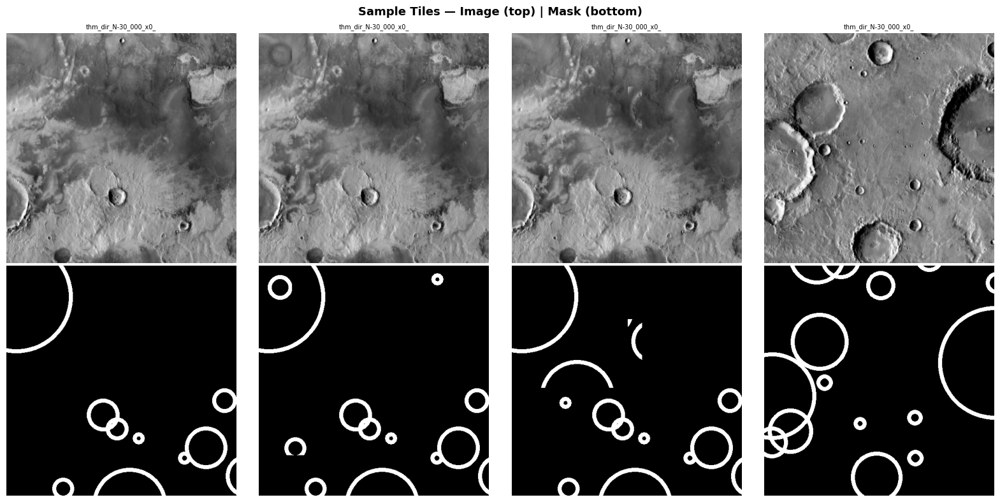

In [10]:
# ── Preview a few tiles ───────────────────────────────────────────────────────
def preview_tiles(n=4):
    img_dir  = Path(CFG.tile_image_dir)
    mask_dir = Path(CFG.tile_mask_dir)
    paths    = sorted(img_dir.glob('*.png'))[:n]
    if not paths: print('No tiles found — run tiling first.'); return
    fig, axes = plt.subplots(2, n, figsize=(4*n, 8))
    fig.suptitle('Sample Tiles — Image (top) | Mask (bottom)', fontsize=13, fontweight='bold')
    for i, p in enumerate(paths):
        img  = cv2.imread(str(p),               cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(str(mask_dir / p.name), cv2.IMREAD_GRAYSCALE)
        axes[0, i].imshow(img,  cmap='gray'); axes[0, i].axis('off')
        axes[0, i].set_title(p.name[:20], fontsize=7)
        axes[1, i].imshow(mask, cmap='gray'); axes[1, i].axis('off')
    plt.tight_layout(); plt.show()

preview_tiles()


## Section 5 — Model Architectures

All four models are defined here. The `build_model()` factory at the bottom  
instantiates the correct one based on `MODEL_NAME`.


In [11]:
# ════════════════════════════════════════════════════════════════
#  SHARED BUILDING BLOCKS (used by multiple architectures)
# ════════════════════════════════════════════════════════════════

class ConvBnRelu(nn.Module):
    def __init__(self, in_ch, out_ch, kernel=3, padding=1, dilation=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel, padding=padding,
                      dilation=dilation, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
    def forward(self, x): return self.block(x)

class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(ConvBnRelu(in_ch, out_ch), ConvBnRelu(out_ch, out_ch))
    def forward(self, x): return self.block(x)

class UpBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up   = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv = DoubleConv(in_ch + skip_ch, out_ch)
    def forward(self, x, skip):
        x = self.up(x)
        x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=True)
        return self.conv(torch.cat([skip, x], dim=1))

class DilatedConvBnRelu(nn.Module):
    """3×3 dilated Conv-BN-ReLU — separate from ConvBnRelu for clarity."""
    def __init__(self, in_ch, out_ch, dilation=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=dilation, dilation=dilation, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
    def forward(self, x): return self.block(x)

print('✓ Shared building blocks defined')


✓ Shared building blocks defined


### Model 1 — RDT-UNet++

Novel architecture: Dilated-Residual-Dense encoder · CBAM / Window / Cross-scale / Circular Transformer skips · Residual decoder · Channel-reduced MSF head · Deep supervision.

In [12]:
# ════════════════════════════════════════════════════════════════
#  MODEL 1 — RDT-UNet++
# ════════════════════════════════════════════════════════════════

class DilatedResidualDenseBlock(nn.Module):
    """1×1 compress → 3 parallel dilated convs (rates 1,2,4) → fuse → residual."""
    def __init__(self, in_ch: int, out_ch: int):
        super().__init__()
        self.compress = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.d1 = DilatedConvBnRelu(out_ch, out_ch, 1)
        self.d2 = DilatedConvBnRelu(out_ch, out_ch, 2)
        self.d4 = DilatedConvBnRelu(out_ch, out_ch, 4)
        self.fuse = nn.Sequential(
            nn.Conv2d(out_ch * 3, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch))
    def forward(self, x):
        x   = self.compress(x)
        out = self.fuse(torch.cat([self.d1(x), self.d2(x), self.d4(x)], dim=1))
        return F.relu(out + x, inplace=True)


class CBAMSkip(nn.Module):
    """Channel + Spatial attention (CBAM) on skip connections at L1 and L2."""
    def __init__(self, channels: int, reduction: int = 16):
        super().__init__()
        mid = max(channels // reduction, 8)
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.channel_mlp = nn.Sequential(
            nn.Flatten(),
            nn.Linear(channels, mid, bias=False), nn.ReLU(inplace=True),
            nn.Linear(mid, channels, bias=False))
        self.spatial_conv = nn.Sequential(
            nn.Conv2d(2, 1, 7, padding=3, bias=False), nn.BatchNorm2d(1))
    def forward(self, x):
        B, C = x.shape[:2]
        ca = torch.sigmoid(
            self.channel_mlp(self.avg_pool(x)) +
            self.channel_mlp(self.max_pool(x))).view(B, C, 1, 1)
        x = x * ca
        sa = torch.sigmoid(self.spatial_conv(
            torch.cat([x.mean(dim=1, keepdim=True),
                       x.max(dim=1, keepdim=True).values], dim=1)))
        return x * sa


class WindowTransformerSkip(nn.Module):
    """Window self-attention on a skip connection."""
    def __init__(self, channels: int, window_size: int = 8,
                 n_heads: int = 4, n_layers: int = 1):
        super().__init__()
        while channels % n_heads != 0 and n_heads > 1: n_heads -= 1
        self.ws = window_size
        layer = nn.TransformerEncoderLayer(
            d_model=channels, nhead=n_heads,
            dim_feedforward=channels * 2, dropout=0.1,
            batch_first=True, norm_first=True)
        self.transformer = nn.TransformerEncoder(layer, num_layers=n_layers)
        self.out_norm    = nn.LayerNorm(channels)

    def _partition(self, x, ws):
        B, C, H, W = x.shape
        pH, pW = (ws - H % ws) % ws, (ws - W % ws) % ws
        if pH > 0 or pW > 0: x = F.pad(x, (0, pW, 0, pH))
        _, _, Hp, Wp = x.shape
        x = x.reshape(B, C, Hp//ws, ws, Wp//ws, ws)
        return x.permute(0,2,4,3,5,1).reshape(-1, ws*ws, C), (Hp, Wp, pH, pW)

    def _unpartition(self, x, B, C, Hp, Wp, pH, pW, ws):
        nH, nW = Hp//ws, Wp//ws
        x = x.reshape(B, nH, nW, ws, ws, C).permute(0,5,1,3,2,4).reshape(B, C, Hp, Wp)
        if pH > 0 or pW > 0: x = x[:, :, :Hp-pH, :Wp-pW]
        return x

    def forward(self, x):
        B, C, H, W = x.shape
        ws = min(self.ws, H, W)
        tokens, (Hp, Wp, pH, pW) = self._partition(x, ws)
        tokens  = self.out_norm(self.transformer(tokens))
        refined = self._unpartition(tokens, B, C, Hp, Wp, pH, pW, ws)
        return x + refined


class CrossScaleTransformerSkip(nn.Module):
    """Window self-attn on L3 + pooled cross-attn with L4 (global context)."""
    def __init__(self, channels_l3: int, channels_l4: int,
                 n_heads: int = 8, n_layers: int = 1, pool_size: int = 8):
        super().__init__()
        while channels_l3 % n_heads != 0 and n_heads > 1: n_heads -= 1
        self.pool_size = pool_size
        self.l4_proj   = nn.Conv2d(channels_l4, channels_l3, 1, bias=False)
        self.self_attn = WindowTransformerSkip(channels_l3, 8, n_heads, n_layers)
        self.cross_attn = nn.MultiheadAttention(
            channels_l3, n_heads, dropout=0.1, batch_first=True)
        self.cross_norm = nn.LayerNorm(channels_l3)
        self.expand     = nn.Conv2d(channels_l3, channels_l3, 1, bias=False)

    def forward(self, x_l3, x_l4):
        B, C, H, W = x_l3.shape; ps = self.pool_size
        out   = self.self_attn(x_l3)
        l3_p  = F.adaptive_avg_pool2d(out,               (ps, ps))
        l4_p  = F.adaptive_avg_pool2d(self.l4_proj(x_l4),(ps, ps))
        q     = l3_p.flatten(2).permute(0, 2, 1)
        k     = l4_p.flatten(2).permute(0, 2, 1)
        attn_out, _ = self.cross_attn(query=q, key=k, value=k)
        q     = self.cross_norm(q + attn_out)
        cross_up = F.interpolate(
            self.expand(q.permute(0,2,1).reshape(B,C,ps,ps)),
            size=(H,W), mode='bilinear', align_corners=True)
        return out + cross_up


class CircularTransformerSkip(nn.Module):
    """Window attention + learned radial-geometry gate (circular inductive bias)."""
    def __init__(self, channels: int, n_heads: int = 8,
                 n_layers: int = 2, window_size: int = 8):
        super().__init__()
        self.win_attn = WindowTransformerSkip(channels, window_size, n_heads, n_layers)
        self.radial_mlp = nn.Sequential(
            nn.Conv2d(3, 32, 1, bias=False), nn.ReLU(inplace=True),
            nn.Conv2d(32, channels, 1, bias=False), nn.Sigmoid())

    def _radial_coords(self, H, W, device):
        ys = torch.linspace(-1, 1, H, device=device)
        xs = torch.linspace(-1, 1, W, device=device)
        gy, gx = torch.meshgrid(ys, xs, indexing='ij')
        gr = (gx**2 + gy**2).sqrt() / (2**0.5)
        return torch.stack([gx, gy, gr], 0).unsqueeze(0)

    def forward(self, x):
        B, C, H, W = x.shape
        out    = self.win_attn(x)
        coords = self._radial_coords(H, W, x.device).expand(B, -1, -1, -1)
        gate   = self.radial_mlp(coords)
        return x + out * gate


class RDTUpBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up   = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(in_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.fuse = nn.Sequential(
            nn.Conv2d(out_ch + skip_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.conv1 = ConvBnRelu(out_ch, out_ch)
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False), nn.BatchNorm2d(out_ch))
    def forward(self, x, skip):
        x = self.up(x)
        if x.shape[2:] != skip.shape[2:]:
            x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=True)
        x   = self.fuse(torch.cat([x, skip], dim=1))
        out = self.conv2(self.conv1(x))
        return F.relu(out + x, inplace=True)


class ChannelReducedMSFHead(nn.Module):
    """Multi-scale fusion: reduce d2/d3 channels first, then upsample (memory-efficient)."""
    def __init__(self, ch0, ch1, ch2, reduce_ch=32, out_channels=1):
        super().__init__()
        self.reduce_d2 = nn.Sequential(
            nn.Conv2d(ch1, reduce_ch, 1, bias=False), nn.BatchNorm2d(reduce_ch), nn.ReLU(inplace=True))
        self.reduce_d3 = nn.Sequential(
            nn.Conv2d(ch2, reduce_ch, 1, bias=False), nn.BatchNorm2d(reduce_ch), nn.ReLU(inplace=True))
        total = ch0 + reduce_ch + reduce_ch
        self.fuse = nn.Sequential(
            ConvBnRelu(total, ch0), ConvBnRelu(ch0, ch0 // 2),
            nn.Conv2d(ch0 // 2, out_channels, 1))
    def forward(self, d1, d2, d3):
        H, W = d1.shape[2:]
        d2r  = self.reduce_d2(d2)
        d3r  = self.reduce_d3(d3)
        d2u  = F.interpolate(d2r, (H, W), mode='bilinear', align_corners=True)
        d3u  = F.interpolate(d3r, (H, W), mode='bilinear', align_corners=True)
        return self.fuse(torch.cat([d1, d2u, d3u], dim=1))


class RDTAuxHead(nn.Module):
    def __init__(self, in_ch, out_ch=1):
        super().__init__()
        self.head = nn.Sequential(
            nn.Conv2d(in_ch, in_ch//2, 3, padding=1, bias=False),
            nn.BatchNorm2d(in_ch//2), nn.ReLU(inplace=True),
            nn.Conv2d(in_ch//2, out_ch, 1))
    def forward(self, x, target_size):
        return F.interpolate(self.head(x), size=target_size, mode='bilinear', align_corners=True)


class RDTUNetPlusPlus(nn.Module):
    """
    RDT-UNet++ — novel architecture for planetary crater segmentation.

    Encoder : DilatedResidualDenseBlock (rates 1,2,4) at all 4 levels
    Skip L1 : CBAMSkip (full res)
    Skip L2 : CBAMSkip (H/2)
    Skip L3 : CrossScaleTransformerSkip (window self-attn + pooled cross-attn with L4)
    Skip L4 : CircularTransformerSkip (window attn + radial geometry gate)
    Decoder : RDTUpBlock (residual) at all 4 levels
    Head    : ChannelReducedMSFHead (d1 + d2↓32ch + d3↓32ch)
    Training: AuxHead at d2 and d3 (deep supervision, discarded at inference)

    forward() train  → (main_logit, aux_d3_logit, aux_d2_logit)
    forward() eval   → main_logit
    """
    def __init__(self, in_channels=1, out_channels=1, base_ch=32, attn_heads=8):
        super().__init__()
        ch = [base_ch * (2**i) for i in range(4)]  # [32, 64, 128, 256]

        self.stem = nn.Sequential(ConvBnRelu(in_channels, ch[0]), ConvBnRelu(ch[0], ch[0]))
        self.pool = nn.MaxPool2d(2, 2)

        # This is the main contribution on encoder side
        self.enc1 = DilatedResidualDenseBlock(ch[0], ch[0])
        self.enc2 = DilatedResidualDenseBlock(ch[0], ch[1])
        self.enc3 = DilatedResidualDenseBlock(ch[1] + ch[0], ch[2])
        self.enc4 = DilatedResidualDenseBlock(ch[2] + ch[1] + ch[0], ch[3])

        # Here, in skip connections, we have added different kinds of attention mechanism at level of the architecture. (Our Contribution)
        self.skip1 = CBAMSkip(ch[0])
        self.skip2 = CBAMSkip(ch[1])
        self.skip3 = CrossScaleTransformerSkip(
            ch[2], ch[3], n_heads=min(attn_heads, ch[2]//8), n_layers=1, pool_size=8)
        self.skip4 = CircularTransformerSkip(
            ch[3], n_heads=min(attn_heads, ch[3]//8), n_layers=2, window_size=8)

        # Again here on Decoder side, we are fusing these attented feature maps with input from lower decoder layer and also added the residual connections. (Our Contribution)
        self.dec3 = RDTUpBlock(ch[3], ch[2], ch[2])
        self.dec2 = RDTUpBlock(ch[2], ch[1], ch[1])
        self.dec1 = RDTUpBlock(ch[1], ch[0], ch[0])

        self.head   = ChannelReducedMSFHead(ch[0], ch[1], ch[2], reduce_ch=32, out_channels=out_channels)
        self.aux_l3 = RDTAuxHead(ch[2], out_channels)
        self.aux_l2 = RDTAuxHead(ch[1], out_channels)
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None: nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight); nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None: nn.init.zeros_(m.bias)

    def forward(self, x):
        H_in, W_in = x.shape[2:]
        s  = self.stem(x);  e1 = self.enc1(s)
        p1 = self.pool(e1); e2 = self.enc2(p1)
        p2, p1x2 = self.pool(e2), self.pool(p1)
        e3 = self.enc3(torch.cat([p2, p1x2], dim=1))
        p3, p2x2, p1x3 = self.pool(e3), self.pool(p2), self.pool(p1x2)
        e4 = self.enc4(torch.cat([p3, p2x2, p1x3], dim=1))
        sk1 = self.skip1(e1); sk2 = self.skip2(e2)
        sk4 = self.skip4(e4); sk3 = self.skip3(e3, e4)
        d3  = self.dec3(sk4, sk3); d2 = self.dec2(d3, sk2); d1 = self.dec1(d2, sk1)
        main = self.head(d1, d2, d3)
        if self.training:
            return main, self.aux_l3(d3, (H_in, W_in)), self.aux_l2(d2, (H_in, W_in))
        return main

print('✓ RDT-UNet++ defined')


✓ RDT-UNet++ defined


### Model 2 — SwinCraterNet

Pretrained Swin-T encoder · ASPP bottleneck + Circular gate · Dilated Residual decoder · MSF head · Deep supervision.

In [13]:
# ════════════════════════════════════════════════════════════════
#  MODEL 2 — SwinCraterNet
# ════════════════════════════════════════════════════════════════

class GrayTo3Ch(nn.Module):
    """Learnable 1→3 channel adapter for grayscale input."""
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv2d(1, 3, 1, bias=False)
        nn.init.ones_(self.conv.weight)
    def forward(self, x): return self.conv(x)


class SwinCBAMSkip(nn.Module):
    """CBAM skip connection (all 4 levels of SwinCraterNet)."""
    def __init__(self, channels, reduction=16):
        super().__init__()
        mid = max(channels // reduction, 8)
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.channel_mlp = nn.Sequential(
            nn.Flatten(),
            nn.Linear(channels, mid, bias=False), nn.ReLU(inplace=True),
            nn.Linear(mid, channels, bias=False))
        self.spatial_conv = nn.Sequential(
            nn.Conv2d(2, 1, 7, padding=3, bias=False), nn.BatchNorm2d(1))
    def forward(self, x):
        B, C = x.shape[:2]
        ca = torch.sigmoid(
            self.channel_mlp(self.avg_pool(x)) +
            self.channel_mlp(self.max_pool(x))).view(B, C, 1, 1)
        x  = x * ca
        sa = torch.sigmoid(self.spatial_conv(
            torch.cat([x.mean(1, True), x.max(1, True).values], 1)))
        return x * sa


class ASPPBottleneck(nn.Module):
    """Atrous Spatial Pyramid Pooling between Swin encoder and decoder."""
    def __init__(self, in_ch, out_ch, rates=(1, 6, 12, 18)):
        super().__init__()
        self.convs = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=r, dilation=r, bias=False),
                nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
            for r in rates])
        self.global_pool = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.fuse = nn.Sequential(
            nn.Conv2d(out_ch * (len(rates) + 1), out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True), nn.Dropout2d(0.1))
    def forward(self, x):
        H, W = x.shape[2:]
        gp   = F.interpolate(self.global_pool(x), (H, W), mode='bilinear', align_corners=True)
        return self.fuse(torch.cat([c(x) for c in self.convs] + [gp], dim=1))


class CircularGeometryGate(nn.Module):
    """Radial-geometry modulation at the bottleneck."""
    def __init__(self, channels):
        super().__init__()
        self.radial_mlp = nn.Sequential(
            nn.Conv2d(3, 32, 1, bias=False), nn.ReLU(inplace=True),
            nn.Conv2d(32, channels, 1, bias=False), nn.Sigmoid())
    def _coords(self, H, W, device):
        ys = torch.linspace(-1, 1, H, device=device)
        xs = torch.linspace(-1, 1, W, device=device)
        gy, gx = torch.meshgrid(ys, xs, indexing='ij')
        gr = (gx**2 + gy**2).sqrt() / (2**0.5)
        return torch.stack([gx, gy, gr], 0).unsqueeze(0)
    def forward(self, x):
        B, C, H, W = x.shape
        coords = self._coords(H, W, x.device).expand(B, -1, -1, -1)
        return x * self.radial_mlp(coords)


class DilatedResDecBlock(nn.Module):
    """Decoder block: upsample → fuse skip → 3 parallel dilated convs → residual."""
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up   = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(in_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.fuse = nn.Sequential(
            nn.Conv2d(out_ch + skip_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.d1 = DilatedConvBnRelu(out_ch, out_ch, 1)
        self.d2 = DilatedConvBnRelu(out_ch, out_ch, 2)
        self.d4 = DilatedConvBnRelu(out_ch, out_ch, 4)
        self.merge = nn.Sequential(
            nn.Conv2d(out_ch * 3, out_ch, 1, bias=False), nn.BatchNorm2d(out_ch))
    def forward(self, x, skip):
        x = self.up(x)
        if x.shape[2:] != skip.shape[2:]:
            x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=True)
        x   = self.fuse(torch.cat([x, skip], dim=1))
        out = self.merge(torch.cat([self.d1(x), self.d2(x), self.d4(x)], dim=1))
        return F.relu(out + x, inplace=True)


class SwinMSFHead(nn.Module):
    """Multi-scale fusion head (same memory-efficient design as RDT-UNet++)."""
    def __init__(self, ch0, ch1, ch2, reduce=32, out_ch=1):
        super().__init__()
        self.r2 = nn.Sequential(nn.Conv2d(ch1, reduce, 1, bias=False),
                                  nn.BatchNorm2d(reduce), nn.ReLU(inplace=True))
        self.r3 = nn.Sequential(nn.Conv2d(ch2, reduce, 1, bias=False),
                                  nn.BatchNorm2d(reduce), nn.ReLU(inplace=True))
        total = ch0 + reduce + reduce
        self.fuse = nn.Sequential(
            ConvBnRelu(total, ch0), ConvBnRelu(ch0, ch0 // 2),
            nn.Conv2d(ch0 // 2, out_ch, 1))
    def forward(self, d1, d2, d3):
        H, W = d1.shape[2:]
        d2u  = F.interpolate(self.r2(d2), (H, W), mode='bilinear', align_corners=True)
        d3u  = F.interpolate(self.r3(d3), (H, W), mode='bilinear', align_corners=True)
        return self.fuse(torch.cat([d1, d2u, d3u], dim=1))


class SwinAuxHead(nn.Module):
    def __init__(self, in_ch, out_ch=1):
        super().__init__()
        self.head = nn.Sequential(
            nn.Conv2d(in_ch, in_ch//2, 3, padding=1, bias=False),
            nn.BatchNorm2d(in_ch//2), nn.ReLU(inplace=True),
            nn.Conv2d(in_ch//2, out_ch, 1))
    def forward(self, x, size):
        return F.interpolate(self.head(x), size=size, mode='bilinear', align_corners=True)


class SwinCraterNet(nn.Module):
    """
    SwinCraterNet — pretrained Swin-T encoder + crater-aware RDT decoder.

    Encoder : Swin-T (timm, pretrained ImageNet, freeze_stages optional)
    Skip    : SwinCBAMSkip at all 4 levels
    Bridge  : ASPPBottleneck (rates 1,6,12,18) + CircularGeometryGate
    Decoder : DilatedResDecBlock × 4 + final 4× upsample
    Head    : SwinMSFHead (d1 + d2 + d3 multi-scale)
    Training: SwinAuxHead at d4 and d3 levels

    forward() train → (main_logit, aux_d4, aux_d3)
    forward() eval  → main_logit
    """
    def __init__(self, in_channels=1, out_channels=1, pretrained=True, freeze_stages=0):
        super().__init__()
        self.gray_adapter = GrayTo3Ch() if in_channels == 1 else nn.Identity()

        try:
            self.swin = timm.create_model(
                'swin_tiny_patch4_window7_224',
                pretrained=pretrained, features_only=True,
                out_indices=(0, 1, 2, 3), img_size=512)
            enc_chs = [96, 192, 384, 768]
        except Exception:
            self.swin = None
            enc_chs   = [64, 128, 256, 512]
            self._build_fallback_encoder(enc_chs)

        if freeze_stages > 0 and self.swin is not None:
            for i, layer in enumerate(self.swin.children()):
                if i < freeze_stages:
                    for p in layer.parameters(): p.requires_grad = False

        self.skip1 = SwinCBAMSkip(enc_chs[0]); self.skip2 = SwinCBAMSkip(enc_chs[1])
        self.skip3 = SwinCBAMSkip(enc_chs[2]); self.skip4 = SwinCBAMSkip(enc_chs[3])

        bot_ch   = 256
        self.aspp = ASPPBottleneck(enc_chs[3], bot_ch, rates=(1, 6, 12, 18))
        self.circ = CircularGeometryGate(bot_ch)

        dec_chs = [128, 64, 32, 32]
        self.dec4 = DilatedResDecBlock(bot_ch,     enc_chs[2], dec_chs[0])
        self.dec3 = DilatedResDecBlock(dec_chs[0], enc_chs[1], dec_chs[1])
        self.dec2 = DilatedResDecBlock(dec_chs[1], enc_chs[0], dec_chs[2])
        self.dec1 = nn.Sequential(
            nn.Upsample(scale_factor=4, mode='bilinear', align_corners=True),
            ConvBnRelu(dec_chs[2], dec_chs[3]), ConvBnRelu(dec_chs[3], dec_chs[3]))

        self.head    = SwinMSFHead(dec_chs[3], dec_chs[2], dec_chs[1], reduce=16, out_ch=out_channels)
        self.aux_d4  = SwinAuxHead(dec_chs[0], out_channels)
        self.aux_d3  = SwinAuxHead(dec_chs[1], out_channels)
        self._init_new_weights()

    def _build_fallback_encoder(self, chs):
        self.enc1 = nn.Sequential(ConvBnRelu(3,chs[0]),ConvBnRelu(chs[0],chs[0]),nn.MaxPool2d(4))
        self.enc2 = nn.Sequential(ConvBnRelu(chs[0],chs[1]),ConvBnRelu(chs[1],chs[1]),nn.MaxPool2d(2))
        self.enc3 = nn.Sequential(ConvBnRelu(chs[1],chs[2]),ConvBnRelu(chs[2],chs[2]),nn.MaxPool2d(2))
        self.enc4 = nn.Sequential(ConvBnRelu(chs[2],chs[3]),ConvBnRelu(chs[3],chs[3]),nn.MaxPool2d(2))

    def _init_new_weights(self):
        skip_types = (nn.modules.batchnorm._BatchNorm, nn.LayerNorm)
        for name, m in self.named_modules():
            if 'swin' in name: continue
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None: nn.init.zeros_(m.bias)
            elif isinstance(m, skip_types):
                if hasattr(m,'weight') and m.weight is not None: nn.init.ones_(m.weight)
                if hasattr(m,'bias')   and m.bias   is not None: nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None: nn.init.zeros_(m.bias)

    def _encode(self, x3ch):
        if self.swin is not None:
            feats = self.swin(x3ch)
            out   = []
            for f in feats:
                if f.ndim == 4 and f.shape[-1] != f.shape[-2]:
                    out.append(f.permute(0,3,1,2).contiguous())
                else:
                    out.append(f)
            return out
        return [self.enc1(x3ch), self.enc2(self.enc1(x3ch)),
                self.enc3(self.enc2(self.enc1(x3ch))),
                self.enc4(self.enc3(self.enc2(self.enc1(x3ch))))]

    def forward(self, x):
        H_in, W_in = x.shape[2:]
        x3 = self.gray_adapter(x)
        e1, e2, e3, e4 = self._encode(x3)
        sk1 = self.skip1(e1); sk2 = self.skip2(e2)
        sk3 = self.skip3(e3); sk4 = self.skip4(e4)
        bot = self.circ(self.aspp(sk4))
        d4  = self.dec4(bot, sk3); d3 = self.dec3(d4,  sk2)
        d2  = self.dec2(d3,  sk1); d1 = self.dec1(d2)
        main = self.head(d1, d2, d3)
        if self.training:
            return main, self.aux_d4(d4, (H_in, W_in)), self.aux_d3(d3, (H_in, W_in))
        return main

print('✓ SwinCraterNet defined')


✓ SwinCraterNet defined


### Model 3 — Multiscale Inception Attention UNet (MIA-UNet)

Multi-scale inception encoder · Spatial Focus Gate on every skip · auxiliary heads at all decoder levels.

In [14]:
# ════════════════════════════════════════════════════════════════
#  MODEL 3 — Multiscale Inception Attention UNet (MSAU-UNet)
# ════════════════════════════════════════════════════════════════

class MultiScaleEncoderBlock(nn.Module):
    """
    4-branch inception encoder: 1×1, 1×1→3×3, 1×1→dilated-3×3 (rate=2), pool→1×1.
    Captures small craters (local) and medium craters (dilated) simultaneously.
    """
    def __init__(self, in_ch: int, out_ch: int):
        super().__init__()
        branch_ch = max(out_ch // 4, 16)
        self.b1 = ConvBnRelu(in_ch, branch_ch, kernel=1, padding=0)
        self.b2 = nn.Sequential(
            ConvBnRelu(in_ch, branch_ch, kernel=1, padding=0),
            ConvBnRelu(branch_ch, branch_ch, kernel=3, padding=1))
        self.b3 = nn.Sequential(
            ConvBnRelu(in_ch, branch_ch, kernel=1, padding=0),
            ConvBnRelu(branch_ch, branch_ch, kernel=3, padding=2, dilation=2))
        self.b4 = nn.Sequential(
            nn.MaxPool2d(kernel_size=3, stride=1, padding=1),
            ConvBnRelu(in_ch, branch_ch, kernel=1, padding=0))
        self.fuse = nn.Sequential(
            nn.Conv2d(branch_ch * 4, out_ch, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
    def forward(self, x):
        return self.fuse(torch.cat([self.b1(x), self.b2(x), self.b3(x), self.b4(x)], 1))


class SpatialFocusGate(nn.Module):
    """Decoder-guided spatial attention gate on skip connections."""
    def __init__(self, skip_ch: int, gate_ch: int, inter_ch: int = None):
        super().__init__()
        inter_ch   = inter_ch or skip_ch // 2
        self.W_skip = nn.Sequential(nn.Conv2d(skip_ch, inter_ch, 1, bias=False), nn.BatchNorm2d(inter_ch))
        self.W_gate = nn.Sequential(nn.Conv2d(gate_ch, inter_ch, 1, bias=False), nn.BatchNorm2d(inter_ch))
        self.psi    = nn.Sequential(nn.Conv2d(inter_ch, 1, 1, bias=False), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu   = nn.ReLU(inplace=True)
    def forward(self, skip, gate):
        if gate.shape[2:] != skip.shape[2:]:
            gate = F.interpolate(gate, size=skip.shape[2:], mode='bilinear', align_corners=True)
        return skip * self.psi(self.relu(self.W_skip(skip) + self.W_gate(gate)))


class GatedDecoderBlock(nn.Module):
    def __init__(self, in_ch: int, skip_ch: int, out_ch: int):
        super().__init__()
        self.up       = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.gate     = SpatialFocusGate(skip_ch=skip_ch, gate_ch=in_ch)
        self.conv     = DoubleConv(in_ch + skip_ch, out_ch)
        self.aux_head = nn.Conv2d(out_ch, 1, kernel_size=1)
    def forward(self, x, skip):
        x    = self.up(x)
        x    = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=True)
        skip = self.gate(skip, gate=x)
        feat = self.conv(torch.cat([skip, x], dim=1))
        return feat, self.aux_head(feat)


class MultiScaleAttentionUNet(nn.Module):
    """
    MSAU-UNet: inception multi-scale encoder + spatial-focus-gate decoder.

    forward() train → (final_logit, [aux_d0, aux_d1, aux_d2, aux_d3])
    forward() eval  → final_logit
    """
    def __init__(self, in_channels=1, out_channels=1, features=(64, 128, 256, 512)):
        super().__init__()
        self.encoders = nn.ModuleList(); self.pools = nn.ModuleList(); self.decoders = nn.ModuleList()
        ch = in_channels
        for f in features:
            self.encoders.append(MultiScaleEncoderBlock(ch, f))
            self.pools.append(nn.MaxPool2d(2)); ch = f
        self.bottleneck = DoubleConv(features[-1], features[-1] * 2)
        rev = list(reversed(features)); in_ch = features[-1] * 2
        for f in rev:
            self.decoders.append(GatedDecoderBlock(in_ch, f, f)); in_ch = f
        self.head = nn.Conv2d(features[0], out_channels, kernel_size=1)
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None: nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight); nn.init.zeros_(m.bias)

    def forward(self, x):
        skips = []
        for enc, pool in zip(self.encoders, self.pools):
            x = enc(x); skips.append(x); x = pool(x)
        x = self.bottleneck(x)
        aux_outputs = []
        for dec, skip in zip(self.decoders, reversed(skips)):
            x, aux = dec(x, skip); aux_outputs.append(aux)
        final = self.head(x)
        if self.training: return final, aux_outputs
        return final

print('✓ MultiScaleAttentionUNet (MSAU-UNet) defined')


✓ MultiScaleAttentionUNet (MSAU-UNet) defined


### Model 4 — Ghost ECA MLP SegNet

Ghost convolutions (cheap depthwise) · ECA channel attention · SegFormer-style MLP decoder.

In [15]:
# ════════════════════════════════════════════════════════════════
#  MODEL 4 — Ghost ECA MLP SegNet
# ════════════════════════════════════════════════════════════════

class ECA_Layer(nn.Module):
    """Efficient Channel Attention — 1D conv on global-pooled features (~3–5 params)."""
    def __init__(self, k_size=3):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv     = nn.Conv1d(1, 1, k_size, padding=(k_size-1)//2, bias=False)
        self.sigmoid  = nn.Sigmoid()
    def forward(self, x):
        b, c, h, w = x.size()
        y = self.avg_pool(x).view(b, 1, c)
        y = self.conv(y).view(b, c, 1, 1)
        return x * self.sigmoid(y)


class GhostModule(nn.Module):
    """Ghost convolution: half channels via standard conv, half via cheap depthwise."""
    def __init__(self, in_ch, out_ch):
        super().__init__()
        half_ch = out_ch // 2
        self.primary_conv = nn.Sequential(
            nn.Conv2d(in_ch, half_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(half_ch), nn.ReLU(inplace=True))
        self.cheap_operation = nn.Sequential(
            nn.Conv2d(half_ch, half_ch, 3, padding=1, groups=half_ch, bias=False),
            nn.BatchNorm2d(half_ch), nn.ReLU(inplace=True))
    def forward(self, x):
        x1 = self.primary_conv(x); x2 = self.cheap_operation(x1)
        return torch.cat([x1, x2], dim=1)


class ResidualGhostBlock(nn.Module):
    """Two Ghost modules + residual shortcut (stabilises training)."""
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.ghost1   = GhostModule(in_ch, out_ch)
        self.ghost2   = GhostModule(out_ch, out_ch)
        self.shortcut = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 1, bias=False), nn.BatchNorm2d(out_ch)
        ) if in_ch != out_ch else nn.Identity()
    def forward(self, x):
        res = self.shortcut(x); x = self.ghost2(self.ghost1(x))
        return F.relu(x + res, inplace=True)


class SegFormerMLPDecoder(nn.Module):
    """
    SegFormer-style all-MLP decoder:
      project each encoder scale to embed_dim → upsample to finest scale → fuse → head.
    """
    def __init__(self, encoder_channels=(64,128,256,512), embed_dim=256, out_channels=1):
        super().__init__()
        self.projections = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(ch, embed_dim, 1, bias=False),
                nn.BatchNorm2d(embed_dim), nn.ReLU(inplace=True))
            for ch in encoder_channels])
        self.fusion = nn.Sequential(
            nn.Conv2d(embed_dim * len(encoder_channels), embed_dim, 3, padding=1, bias=False),
            nn.BatchNorm2d(embed_dim), nn.ReLU(inplace=True), nn.Dropout2d(0.1))
        self.head = nn.Conv2d(embed_dim, out_channels, 1)
    def forward(self, features):
        target_size = features[0].shape[2:]
        proj = []
        for i, feat in enumerate(features):
            p = self.projections[i](feat)
            if i > 0: p = F.interpolate(p, size=target_size, mode='bilinear', align_corners=True)
            proj.append(p)
        return self.head(self.fusion(torch.cat(proj, dim=1)))


class GhostECAMLPSegNet(nn.Module):
    """
    Ghost ECA MLP SegNet — efficient hybrid architecture.

    Encoder : stacked ResidualGhostBlock stages + ECA channel attention
    Decoder : SegFormerMLPDecoder (project all scales to embed_dim → fuse → upsample)

    forward() → single logit (no deep supervision; simple and fast)
    """
    def __init__(self, in_channels=1, out_channels=1,
                 features=(64, 128, 256, 512),
                 depths=(2, 2, 4, 2),
                 embed_dim=256):
        super().__init__()
        self.encoders = nn.ModuleList()
        self.ecas     = nn.ModuleList()
        self.pools    = nn.ModuleList()
        ch = in_channels
        for f, num_blocks in zip(features, depths):
            blocks = [ResidualGhostBlock(ch, f)]
            for _ in range(1, num_blocks): blocks.append(ResidualGhostBlock(f, f))
            self.encoders.append(nn.Sequential(*blocks))
            self.ecas.append(ECA_Layer())
            self.pools.append(nn.MaxPool2d(2))
            ch = f
        self.decoder = SegFormerMLPDecoder(
            encoder_channels=features, embed_dim=embed_dim, out_channels=out_channels)

    def forward(self, x):
        original_size = x.shape[2:]
        feats = []
        for enc, eca, pool in zip(self.encoders, self.ecas, self.pools):
            x = eca(enc(x)); feats.append(x); x = pool(x)
        logits = self.decoder(feats)
        return F.interpolate(logits, size=original_size, mode='bilinear', align_corners=True)

print('✓ GhostECAMLPSegNet defined')


✓ GhostECAMLPSegNet defined


### Model Registry & Sanity Check

In [16]:
# ════════════════════════════════════════════════════════════════
#  MODEL REGISTRY — plug-and-play factory
# ════════════════════════════════════════════════════════════════

MODELS = {
    'rdt_unet_plusplus': RDTUNetPlusPlus,
    'swin_crater_net'  : SwinCraterNet,
    'mia_unet'        : MultiScaleAttentionUNet,
    'ghost_eca_mlp'    : GhostECAMLPSegNet,
}

def build_model(name: str, **kwargs) -> nn.Module:
    """
    Instantiate a model by name.  Extra kwargs not accepted by a model are silently dropped.
    Always use this factory — it handles per-model constructor differences.
    """
    if name not in MODELS:
        raise ValueError(f'Unknown model: "{name}". Choose from: {list(MODELS.keys())}')
    # Strip kwargs that only apply to specific models
    if name == 'swin_crater_net':
        model = SwinCraterNet(
            in_channels=kwargs.get('in_channels', 1),
            out_channels=kwargs.get('out_channels', 1),
            pretrained=True)
    elif name == 'mia_unet':
        model = MultiScaleAttentionUNet(
            in_channels=kwargs.get('in_channels', 1),
            out_channels=kwargs.get('out_channels', 1))
    elif name == 'ghost_eca_mlp':
        model = GhostECAMLPSegNet(
            in_channels=kwargs.get('in_channels', 1),
            out_channels=kwargs.get('out_channels', 1))
    else:  # rdt_unet_plusplus
        model = RDTUNetPlusPlus(
            in_channels=kwargs.get('in_channels', 1),
            out_channels=kwargs.get('out_channels', 1),
            base_ch=kwargs.get('base_ch', 32))
    n = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'  [{name}]  Trainable parameters: {n:,}')
    return model

print(f'Available models: {list(MODELS.keys())}')


Available models: ['rdt_unet_plusplus', 'swin_crater_net', 'mia_unet', 'ghost_eca_mlp']


In [17]:
# ── Sanity check selected model ───────────────────────────────────────────────
print(f'Sanity-checking {MODEL_NAME} ...')
_m = build_model(MODEL_NAME, in_channels=CFG.in_channels, out_channels=CFG.out_channels)
_x = torch.randn(2, CFG.in_channels, 512, 512)
_m.train()
with torch.no_grad():
    _out_train = _m(_x)
if isinstance(_out_train, tuple):
    _main = _out_train[0]
    _auxs = _out_train[1:]
    aux_shapes = [tuple(a.shape) if isinstance(a, torch.Tensor) else
                  [tuple(aa.shape) for aa in a] for a in _auxs]
    print(f'  ✓ Train: main={tuple(_main.shape)}  aux={aux_shapes}')
else:
    print(f'  ✓ Train: {tuple(_out_train.shape)}')
_m.eval()
with torch.no_grad(): _out = _m(_x)
print(f'  ✓ Eval : {tuple(_out.shape)}')
del _m, _x
print('  Sanity check passed.')


Sanity-checking swin_crater_net ...


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

  [swin_crater_net]  Trainable parameters: 36,142,656
  ✓ Train: main=(2, 1, 512, 512)  aux=[(2, 1, 512, 512), (2, 1, 512, 512)]
  ✓ Eval : (2, 1, 512, 512)
  Sanity check passed.


## Section 6 — Loss Functions & Metrics

In [18]:
class DiceLoss(nn.Module):
    """Soft Dice Loss — directly optimises overlap (ideal for sparse crater-rim masks)."""
    def __init__(self, smooth=1.0):
        super().__init__(); self.smooth = smooth
    def forward(self, logits, targets):
        p = torch.sigmoid(logits).view(-1); t = targets.view(-1)
        return 1.0 - (2.0*(p*t).sum() + self.smooth) / (p.sum() + t.sum() + self.smooth)


class CombinedLoss(nn.Module):
    """Weighted BCE + Dice.  pos_weight handles extreme class imbalance."""
    def __init__(self, bce_weight=0.5, dice_weight=0.5, pos_weight=10.0):
        super().__init__()
        self.bw   = bce_weight; self.dw = dice_weight
        self.bce  = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]))
        self.dice = DiceLoss()
    def forward(self, logits, targets):
        return self.bw * self.bce(logits, targets) + self.dw * self.dice(logits, targets)


class DeepSupervisionLoss(nn.Module):
    """
    Unified loss function supporting ALL model output conventions:

      2-arg  (validation / GhostECAMLP)  : criterion(logits, targets)
      3-arg  (mia_unet)                 : criterion(main, aux_list, targets)
                                           where aux_list is a Python list of tensors
      4-arg  (rdt_unet_plusplus /
              swin_crater_net)           : criterion(main, aux3, aux2, targets)

    Auxiliary loss weights: aux[0] × 0.4, aux[1] × 0.2, aux[2+] × 0.1
    """
    def __init__(self, bce_weight=0.5, dice_weight=0.5, pos_weight=10.0,
                 aux_l3_weight=0.4, aux_l2_weight=0.2):
        super().__init__()
        self.aux3_w = aux_l3_weight; self.aux2_w = aux_l2_weight
        self.bw = bce_weight; self.dw = dice_weight; self._pw = pos_weight

    def _get_bce(self, device):
        if not hasattr(self, '_bce') or self._bce.pos_weight.device != device:
            self._bce = nn.BCEWithLogitsLoss(
                pos_weight=torch.tensor([self._pw], device=device))
        return self._bce

    def _dice(self, logits, targets, smooth=1.0):
        p = torch.sigmoid(logits).view(-1); t = targets.view(-1)
        return 1.0 - (2.0*(p*t).sum() + smooth) / (p.sum() + t.sum() + smooth)

    def _single(self, logits, targets):
        return self.bw * self._get_bce(logits.device)(logits, targets) \
             + self.dw * self._dice(logits, targets)

    def forward(self, main, aux3_or_list_or_targets, aux2=None, targets=None):
        H, W = main.shape[2:]

        # 2-arg: validation or single-output models
        if aux2 is None and targets is None:
            return self._single(main, aux3_or_list_or_targets)

        # 3-arg: mia_unet  →  criterion(main, aux_list, targets)
        if isinstance(aux3_or_list_or_targets, (list, tuple)) and targets is None:
            aux_list = aux3_or_list_or_targets; targets = aux2
            weights  = [self.aux3_w, self.aux2_w] + [0.1] * max(0, len(aux_list) - 2)
            loss = self._single(main, targets)
            for w, a in zip(weights, aux_list):
                a_up = F.interpolate(a, (H, W), mode='bilinear', align_corners=True)
                loss = loss + w * self._single(a_up, targets)
            return loss

        # 4-arg: rdt_unet_plusplus / swin_crater_net  →  criterion(main, aux3, aux2, targets)
        a3 = F.interpolate(aux3_or_list_or_targets, (H,W), mode='bilinear', align_corners=True)
        a2 = F.interpolate(aux2,                    (H,W), mode='bilinear', align_corners=True)
        return (self._single(main, targets)
              + self.aux3_w * self._single(a3, targets)
              + self.aux2_w * self._single(a2, targets))


class SegmentationMetrics:
    """Accumulates TP/FP/FN over a full epoch and computes IoU, Dice, Precision, Recall, F1."""
    def __init__(self, threshold=0.5):
        self.threshold = threshold; self.reset()
    def reset(self):
        self.tp = self.fp = self.fn = self.tn = 0
    def update(self, logits, targets):
        preds   = (torch.sigmoid(logits) > self.threshold).float().view(-1).cpu()
        targets = targets.view(-1).cpu()
        self.tp += ((preds==1) & (targets==1)).sum().item()
        self.fp += ((preds==1) & (targets==0)).sum().item()
        self.fn += ((preds==0) & (targets==1)).sum().item()
        self.tn += ((preds==0) & (targets==0)).sum().item()
    def compute(self):
        tp, fp, fn, eps = self.tp, self.fp, self.fn, 1e-7
        iou  = tp / (tp+fp+fn+eps)
        dice = 2*tp / (2*tp+fp+fn+eps)
        prec = tp / (tp+fp+eps)
        rec  = tp / (tp+fn+eps)
        f1   = 2*prec*rec / (prec+rec+eps)
        return {k: round(v,4) for k,v in
                zip(['iou','dice','precision','recall','f1'], [iou,dice,prec,rec,f1])}

print('✓ Loss functions and metrics defined')


✓ Loss functions and metrics defined


## Section 7 — Training Framework

In [19]:
# ── Utilities ────────────────────────────────────────────────────────────────
def gpu_mem_str():
    if torch.cuda.is_available():
        used  = torch.cuda.memory_allocated() / 1024**2
        total = torch.cuda.get_device_properties(0).total_memory / 1024**2
        return f'{used:.0f}/{total:.0f} MB'
    return 'CPU'

def delta_str(current, previous):
    if previous is None: return ''
    diff = current - previous
    return f"({'↑' if diff >= 0 else '↓'}{abs(diff):.4f})"

def format_time(s):
    m, s = divmod(int(s), 60); return f'{m:02d}:{s:02d}'

def print_sep(c='─', w=70): print(c * w)
def print_header(title, w=70):
    print_sep('═', w); pad = (w - len(title) - 2) // 2
    print('║' + ' '*pad + title + ' '*(w-pad-len(title)-2) + '║')
    print_sep('═', w)


In [20]:
class Trainer:
    """
    Universal trainer that works for all 4 models.

    Key features:
      • AMP (mixed-precision) — GPU speed-up with no accuracy loss
      • Gradient clipping (max_norm=1.0)
      • CosineAnnealingLR scheduler
      • Automatic deep-supervision dispatch via _train_epoch_ds()
      • Best-checkpoint saving + early stopping
      • Rich per-batch and per-epoch console logging
    """

    def __init__(self, model, model_name, cfg, train_loader, val_loader,
                 log_every_n_batches=10):
        self.model        = model.to(DEVICE)
        self.model_name   = model_name
        self.cfg          = cfg
        self.train_loader = train_loader
        self.val_loader   = val_loader
        self.log_every    = log_every_n_batches

        self.criterion = DeepSupervisionLoss(
            cfg.bce_weight, cfg.dice_weight, cfg.pos_weight).to(DEVICE)
        self.optimizer = AdamW(model.parameters(),
                               lr=cfg.learning_rate, weight_decay=cfg.weight_decay)
        self.scheduler = CosineAnnealingLR(self.optimizer, T_max=cfg.epochs, eta_min=1e-6)
        self.scaler    = GradScaler(enabled=USE_AMP)
        self.metrics   = SegmentationMetrics()

        self.run_dir = Path(cfg.output_dir) / model_name
        self.run_dir.mkdir(parents=True, exist_ok=True)

        self.best_dice = 0.0; self.best_epoch = 0; self.patience = 0
        self.history   = {k: [] for k in
                          ['train_loss','val_loss','val_iou','val_dice',
                           'val_precision','val_recall','lr']}
        self._prev_val_dice = self._prev_val_iou = self._prev_val_loss = None

    # ── Training epoch — handles all output conventions ────────────────────────
    def train_epoch(self, epoch):
        self.model.train(); total_loss = 0.0
        n_batches = len(self.train_loader); t0 = time.time()
        for batch_idx, (imgs, masks) in enumerate(self.train_loader, 1):
            imgs  = imgs.to(DEVICE, non_blocking=True)
            masks = masks.to(DEVICE, non_blocking=True)
            self.optimizer.zero_grad(set_to_none=True)
            with autocast(enabled=USE_AMP):
                out  = self.model(imgs)
                # Dispatch on output type
                if isinstance(out, (tuple,list)) and len(out) == 2 \
                        and isinstance(out[1], (list,tuple)):
                    # mia_unet: (main, aux_list)
                    loss = self.criterion(out[0], out[1], masks)
                elif isinstance(out, (tuple,list)) and len(out) == 3:
                    # rdt_unet_plusplus / swin_crater_net: (main, aux3, aux2)
                    loss = self.criterion(out[0], out[1], out[2], masks)
                else:
                    # ghost_eca_mlp: single tensor
                    loss = self.criterion(out, masks)
            self.scaler.scale(loss).backward()
            self.scaler.unscale_(self.optimizer)
            grad_norm = torch.nn.utils.clip_grad_norm_(self.model.parameters(), 1.0)
            self.scaler.step(self.optimizer); self.scaler.update()
            total_loss += loss.item()
            if batch_idx % self.log_every == 0 or batch_idx == n_batches:
                eta = (time.time()-t0)/batch_idx*(n_batches-batch_idx)
                print(f'    Batch [{batch_idx:>4d}/{n_batches}] {batch_idx/n_batches*100:5.1f}% | '
                      f'Loss:{loss.item():.4f}(avg:{total_loss/batch_idx:.4f}) '
                      f'Grad:{grad_norm:.3f} ETA:{format_time(eta)} GPU:{gpu_mem_str()}')
        return total_loss / n_batches

    # ── Validation epoch ───────────────────────────────────────────────────────
    @torch.no_grad()
    def val_epoch(self):
        self.model.eval(); self.metrics.reset(); total_loss = 0.0
        print('    Validating', end='', flush=True)
        for i, (imgs, masks) in enumerate(self.val_loader):
            imgs  = imgs.to(DEVICE, non_blocking=True)
            masks = masks.to(DEVICE, non_blocking=True)
            with autocast(enabled=USE_AMP):
                logits = self.model(imgs)
                total_loss += self.criterion(logits, masks).item()
            self.metrics.update(logits, masks)
            if i % 5 == 0: print('.', end='', flush=True)
        print(' done')
        return total_loss / len(self.val_loader), self.metrics.compute()

    # ── Main fit loop ──────────────────────────────────────────────────────────
    def fit(self):
        n_params = sum(p.numel() for p in self.model.parameters() if p.requires_grad)
        print_header(f' {self.model_name.upper()} ')
        print(f'  Parameters   : {n_params:,}')
        print(f'  Device       : {DEVICE}  (AMP={USE_AMP})')
        print(f'  Epochs       : {self.cfg.epochs}')
        print(f'  Batch size   : {self.cfg.batch_size}')
        print(f'  LR           : {self.cfg.learning_rate}  (cosine → 1e-6)')
        print(f'  Loss         : DeepSupervisionLoss  '
              f'BCE×{self.cfg.bce_weight} + Dice×{self.cfg.dice_weight}, '
              f'pos_weight={self.cfg.pos_weight}')
        print(f'  Early stop   : patience={self.cfg.early_stop_patience}')
        print(f'  Train batches: {len(self.train_loader)} | Val batches: {len(self.val_loader)}')
        print_sep()
        total_start = time.time(); epoch_times = []

        for epoch in range(1, self.cfg.epochs + 1):
            epoch_start = time.time(); lr_now = self.optimizer.param_groups[0]['lr']
            print(f"\n  ┌─ Epoch {epoch:03d}/{self.cfg.epochs} {'─'*30} LR:{lr_now:.2e} ─┐")
            print('  │  [TRAIN]')
            train_loss = self.train_epoch(epoch)
            print('  │  [VALID]')
            val_loss, scores = self.val_epoch()
            self.scheduler.step()

            epoch_time = time.time() - epoch_start; epoch_times.append(epoch_time)
            eta_total  = np.mean(epoch_times) * (self.cfg.epochs - epoch)

            for k, v in [('train_loss',train_loss),('val_loss',val_loss),
                         ('val_iou',scores['iou']),('val_dice',scores['dice']),
                         ('val_precision',scores['precision']),
                         ('val_recall',scores['recall']),('lr',lr_now)]:
                self.history[k].append(v)

            dice_d = delta_str(scores['dice'], self._prev_val_dice)
            iou_d  = delta_str(scores['iou'],  self._prev_val_iou)
            loss_d = delta_str(val_loss,        self._prev_val_loss)
            print(f'  │')
            print(f"  │  ┌──────────────── EPOCH {epoch:03d} RESULTS ────────────────┐")
            print(f'  │  │  Train Loss : {train_loss:.6f}')
            print(f'  │  │  Val   Loss : {val_loss:.6f}   {loss_d}')
            print(f"  │  │  {'─'*45}")
            print(f'  │  │  IoU        : {scores["iou"]:.6f}   {iou_d}')
            print(f'  │  │  Dice       : {scores["dice"]:.6f}   {dice_d}')
            print(f'  │  │  Precision  : {scores["precision"]:.6f}')
            print(f'  │  │  Recall     : {scores["recall"]:.6f}')
            print(f'  │  │  F1         : {scores["f1"]:.6f}')
            print(f"  │  │  {'─'*45}")
            print(f'  │  │  Epoch time : {format_time(epoch_time)} | ETA:{format_time(eta_total)}')
            print(f'  │  │  GPU Memory : {gpu_mem_str()}')
            print(f"  │  └─────────────────────────────────────────────────┘")
            self._prev_val_dice = scores['dice']; self._prev_val_iou = scores['iou']
            self._prev_val_loss = val_loss

            if scores['dice'] > self.best_dice:
                imp = scores['dice'] - self.best_dice
                self.best_dice = scores['dice']; self.best_epoch = epoch; self.patience = 0
                torch.save({'epoch':epoch,'model_state':self.model.state_dict(),
                            'optimizer':self.optimizer.state_dict(),
                            'scaler':self.scaler.state_dict(),
                            'val_dice':self.best_dice,'val_scores':scores,
                            'history':self.history},
                           self.run_dir / 'best_model.pth')
                print(f'  │  ✅ NEW BEST! Dice +{imp:.4f} → {self.best_dice:.4f}  [checkpoint saved]')
            else:
                self.patience += 1
                print(f'  │  ⏳ No improvement. Patience: {self.patience}/{self.cfg.early_stop_patience}')
            print(f"  └{'─'*58}┘")
            if self.patience >= self.cfg.early_stop_patience:
                print(f'\n  ⛔ Early stopping at epoch {epoch} '
                      f'(best epoch {self.best_epoch}, Dice={self.best_dice:.4f})')
                break

        total_time = time.time() - total_start
        self._print_summary(total_time, epoch)
        with open(self.run_dir / 'history.json', 'w') as f:
            json.dump(self.history, f, indent=2)
        return {'model':self.model_name,'best_val_dice':self.best_dice,
                'best_epoch':self.best_epoch,'history':self.history,
                'time_min':round(total_time/60,2)}

    def _print_summary(self, total_time, last_epoch):
        print_sep('═')
        print(f'  TRAINING COMPLETE — {self.model_name.upper()}')
        print_sep('═')
        print(f'  Total time    : {format_time(total_time)} ({total_time/60:.1f} min)')
        print(f'  Epochs run    : {last_epoch} | Best epoch: {self.best_epoch}')
        print(f'  Best Val Dice : {self.best_dice:.6f}')
        if self.history['val_dice']:
            print(f'  Final Val IoU : {self.history["val_iou"][-1]:.6f}')
        chars = '▁▂▃▄▅▆▇█'
        for key, label in [('val_loss','Val Loss'),('val_dice','Val Dice')]:
            vals = self.history[key]
            if len(vals) > 1:
                mn, mx = min(vals), max(vals)+1e-9; rng = mx-mn
                spark = ''.join(chars[min(int((v-mn)/rng*(len(chars)-1)),len(chars)-1)] for v in vals[-40:])
                print(f'  {label} trend: {spark}')
        print_sep('═')
        print(f'  Checkpoint → {self.run_dir / "best_model.pth"}')
        print(f'  History    → {self.run_dir / "history.json"}')
        print_sep('═')

print('✓ Trainer defined (AMP-enabled, universal deep-supervision dispatch)')


✓ Trainer defined (AMP-enabled, universal deep-supervision dispatch)


## Section 8 — Train Selected Model

In [21]:
print('Loading dataset...')
train_loader, val_loader, test_loader, test_indices = make_dataloaders(CFG)


Loading dataset...
  Train:9,664 | Val:2,070 | Internal test:2,072


In [22]:
import torch
print('PyTorch version:', torch.__version__)
print('CUDA version PyTorch built with:', torch.version.cuda)
if torch.cuda.is_available():
    print('GPU:', torch.cuda.get_device_name(0))
    print('GPU compute capability:', torch.cuda.get_device_capability(0))


PyTorch version: 2.10.0+cu128
CUDA version PyTorch built with: 12.8
GPU: Tesla T4
GPU compute capability: (7, 5)


In [23]:
set_seed(CFG.seed)
print(f'\n{"#"*60}\n  TRAINING: {MODEL_NAME.upper()}\n{"#"*60}')

model = build_model(MODEL_NAME,
                    in_channels=CFG.in_channels,
                    out_channels=CFG.out_channels).to(DEVICE)

if torch.cuda.is_available():
    print(f'  VRAM after model load: {torch.cuda.memory_allocated()/1e9:.2f} GB')

# SwinCraterNet uses a 2-group optimizer to protect pretrained encoder weights
if MODEL_NAME == 'swin_crater_net':
    swin_params, new_params = [], []
    for name, p in model.named_parameters():
        if not p.requires_grad: continue
        (swin_params if ('swin' in name or 'gray_adapter' in name) else new_params).append(p)
    optimizer = AdamW([
        {'params': swin_params, 'lr': CFG.learning_rate * 0.1},
        {'params': new_params,  'lr': CFG.learning_rate},
    ], weight_decay=CFG.weight_decay)
    print(f'  Encoder lr: {CFG.learning_rate*0.1:.2e}  |  Decoder lr: {CFG.learning_rate:.2e}')
else:
    optimizer = AdamW(model.parameters(), lr=CFG.learning_rate, weight_decay=CFG.weight_decay)

trainer           = Trainer(model, MODEL_NAME, CFG, train_loader, val_loader)
trainer.optimizer = optimizer
trainer.scheduler = CosineAnnealingLR(optimizer, T_max=CFG.epochs, eta_min=1e-6)
result            = trainer.fit()



############################################################
  TRAINING: SWIN_CRATER_NET
############################################################
  [swin_crater_net]  Trainable parameters: 36,142,656
  VRAM after model load: 0.15 GB
  Encoder lr: 5.00e-06  |  Decoder lr: 5.00e-05
══════════════════════════════════════════════════════════════════════
║                          SWIN_CRATER_NET                           ║
══════════════════════════════════════════════════════════════════════
  Parameters   : 36,142,656
  Device       : cuda  (AMP=True)
  Epochs       : 35
  Batch size   : 4
  LR           : 5e-05  (cosine → 1e-6)
  Loss         : DeepSupervisionLoss  BCE×0.5 + Dice×0.5, pos_weight=10.0
  Early stop   : patience=10
  Train batches: 2416 | Val batches: 259
──────────────────────────────────────────────────────────────────────

  ┌─ Epoch 001/35 ────────────────────────────── LR:5.00e-06 ─┐
  │  [TRAIN]
    Batch [  10/2416]   0.4% | Loss:2.0668(avg:2.1648) Grad:14.146 

KeyboardInterrupt: 

## Section 9 — Internal Test Set Evaluation

In [24]:
@torch.no_grad()
def evaluate_test(model, model_name, test_loader, run_dir):
    model.eval(); metrics = SegmentationMetrics()
    for imgs, masks in tqdm(test_loader, desc=f'  Test [{model_name}]', leave=False):
        imgs  = imgs.to(DEVICE, non_blocking=True)
        masks = masks.to(DEVICE, non_blocking=True)
        with autocast(enabled=USE_AMP):
            logits = model(imgs)
        metrics.update(logits, masks)
    scores = metrics.compute(); scores['model'] = model_name
    out_path = Path(run_dir) / model_name / 'test_scores.json'
    with open(out_path, 'w') as f: json.dump(scores, f, indent=2)
    print(f'  Test scores saved → {out_path}')
    return scores

# ── Load best checkpoint ──────────────────────────────────────────────────────
ckpt_path = Path(CFG.output_dir) / MODEL_NAME / 'best_model.pth'
if ckpt_path.exists():
    ckpt  = torch.load(ckpt_path, map_location=DEVICE)
    state = {k.replace('_orig_mod.', ''): v for k, v in ckpt['model_state'].items()}
    model.load_state_dict(state)
    print(f'  Loaded best checkpoint (epoch {ckpt["epoch"]}, val_dice={ckpt["val_dice"]:.4f})')

test_scores = evaluate_test(model, MODEL_NAME, test_loader, CFG.output_dir)

print(f'\n{"="*50}')
print(f'  TEST RESULTS — {MODEL_NAME.upper()}')
print(f'{"="*50}')
for k, v in test_scores.items():
    if k != 'model': print(f'  {k:12s}: {v}')
print(f'{"="*50}')


  Loaded best checkpoint (epoch 1, val_dice=0.5506)


  Test [swin_crater_net]:   0%|          | 0/259 [00:00<?, ?it/s]

  Test scores saved → runs/swin_crater_net/test_scores.json

  TEST RESULTS — SWIN_CRATER_NET
  iou         : 0.377
  dice        : 0.5476
  precision   : 0.4419
  recall      : 0.7197
  f1          : 0.5476


## Section 10 — Visualisation & Analysis

In [25]:
# ── Training Curves ───────────────────────────────────────────────────────────
def plot_training_curves(model_name=MODEL_NAME):
    hist_path = Path(CFG.output_dir) / model_name / 'history.json'
    if not hist_path.exists(): print(f'No history for {model_name}'); return
    with open(hist_path) as f: hist = json.load(f)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'Training Curves — {model_name.upper()}', fontsize=14, fontweight='bold')
    ep = range(1, len(hist['train_loss']) + 1)
    axes[0].plot(ep, hist['train_loss'], '--', label='Train', alpha=0.7)
    axes[0].plot(ep, hist['val_loss'],         label='Val',   lw=2)
    axes[0].set_title('Loss (BCE+Dice)'); axes[0].legend(); axes[0].grid(alpha=0.3)
    axes[1].plot(ep, hist['val_dice'], label='Dice', lw=2)
    axes[1].plot(ep, hist['val_iou'],  label='IoU',  lw=2)
    axes[1].set_title('Validation Metrics'); axes[1].set_ylim(0,1)
    axes[1].legend(); axes[1].grid(alpha=0.3)
    axes[2].plot(ep, hist['lr'], color='orange', lw=2)
    axes[2].set_title('Learning Rate'); axes[2].grid(alpha=0.3)
    plt.tight_layout()
    out = Path(CFG.output_dir) / model_name / 'training_curves.png'
    plt.savefig(out, dpi=150, bbox_inches='tight'); print(f'Saved → {out}'); plt.show()

plot_training_curves()


No history for swin_crater_net


  [swin_crater_net]  Trainable parameters: 36,142,656
Saved → runs/swin_crater_net/qualitative_grid.png


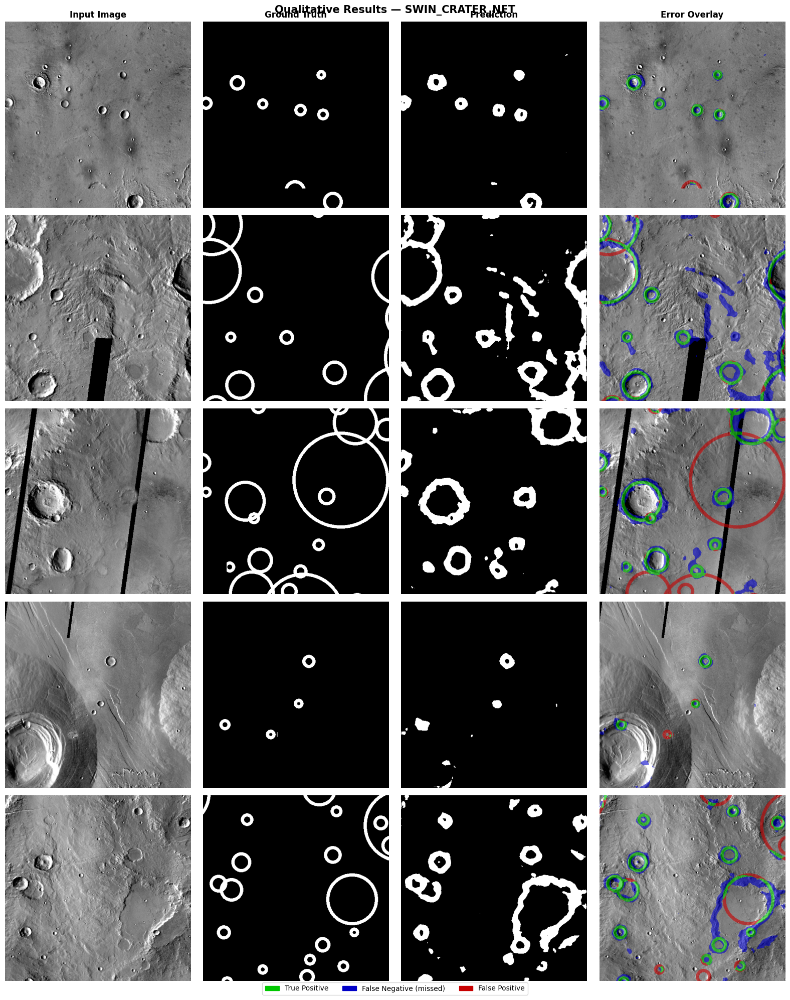

In [26]:
# ── Qualitative Grid: Input | GT | Prediction | Error Overlay ─────────────────
@torch.no_grad()
def predict(model, img_np):
    model.eval()
    t = torch.from_numpy(img_np.astype(np.float32)/255.0).unsqueeze(0).unsqueeze(0).to(DEVICE)
    with autocast(enabled=USE_AMP): out = torch.sigmoid(model(t))
    return (out.squeeze().cpu().float().numpy() > 0.5).astype(np.uint8) * 255

def overlay_masks(img, gt, pred):
    out = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR).astype(np.float32)
    gt_b, pred_b = gt > 127, pred > 127
    out[ gt_b &  pred_b] = out[ gt_b &  pred_b]*0.4 + np.array([0,   200, 0  ])*0.6
    out[ gt_b & ~pred_b] = out[ gt_b & ~pred_b]*0.4 + np.array([0,   0,   200])*0.6
    out[~gt_b &  pred_b] = out[~gt_b &  pred_b]*0.4 + np.array([200, 0,   0  ])*0.6
    return out.astype(np.uint8)

def plot_qualitative(model_name=MODEL_NAME, n_samples=5):
    m = build_model(model_name, in_channels=1, out_channels=1).to(DEVICE)
    ckpt  = torch.load(Path(CFG.output_dir)/model_name/'best_model.pth', map_location=DEVICE)
    state = {k.replace('_orig_mod.',''):v for k,v in ckpt['model_state'].items()}
    m.load_state_dict(state)
    img_dir  = Path(CFG.tile_image_dir); mask_dir = Path(CFG.tile_mask_dir)
    all_pngs = sorted(img_dir.glob('*.png'))
    if not all_pngs: print('No tiles found.'); return
    samples  = random.sample(all_pngs, min(n_samples, len(all_pngs)))
    fig, axes = plt.subplots(n_samples, 4, figsize=(16, 4*n_samples))
    if n_samples == 1: axes = axes[np.newaxis, :]
    fig.suptitle(f'Qualitative Results — {model_name.upper()}', fontsize=15, fontweight='bold')
    for ax, t in zip(axes[0], ['Input Image','Ground Truth','Prediction','Error Overlay']):
        ax.set_title(t, fontsize=12, fontweight='bold')
    for i, p in enumerate(samples):
        img  = cv2.imread(str(p),               cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(str(mask_dir/p.name), cv2.IMREAD_GRAYSCALE)
        pred = predict(m, img); overlay = overlay_masks(img, mask, pred)
        axes[i,0].imshow(img,  cmap='gray'); axes[i,0].axis('off')
        axes[i,1].imshow(mask, cmap='gray'); axes[i,1].axis('off')
        axes[i,2].imshow(pred, cmap='gray'); axes[i,2].axis('off')
        axes[i,3].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)); axes[i,3].axis('off')
    handles = [mpatches.Patch(color=(0,.78,0),  label='True Positive'),
               mpatches.Patch(color=(0,0,.78),  label='False Negative (missed)'),
               mpatches.Patch(color=(.78,0,0),  label='False Positive')]
    fig.legend(handles=handles, loc='lower center', ncol=3, fontsize=10, bbox_to_anchor=(0.5,-0.01))
    plt.tight_layout()
    out = Path(CFG.output_dir)/model_name/'qualitative_grid.png'
    plt.savefig(out, dpi=150, bbox_inches='tight'); print(f'Saved → {out}'); plt.show()

plot_qualitative()


  [swin_crater_net]  Trainable parameters: 36,142,656


Size analysis [swin_crater_net]:   0%|          | 0/200 [00:00<?, ?it/s]

Saved → runs/swin_crater_net/size_analysis.png


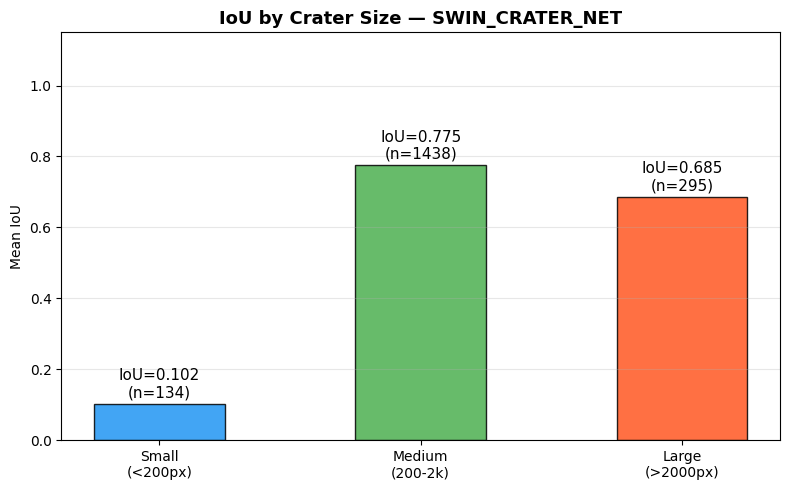

Size-wise IoU: {'Small': 0.1022, 'Medium': 0.7746, 'Large': 0.685}


In [27]:
# ── Crater Size Analysis: Small / Medium / Large ──────────────────────────────
@torch.no_grad()
def analyze_by_size(model_name=MODEL_NAME, n_tiles=200):
    m = build_model(model_name, in_channels=1, out_channels=1).to(DEVICE)
    state = {k.replace('_orig_mod.',''):v
             for k,v in torch.load(Path(CFG.output_dir)/model_name/'best_model.pth',
                                   map_location=DEVICE)['model_state'].items()}
    m.load_state_dict(state)
    img_dir  = Path(CFG.tile_image_dir); mask_dir = Path(CFG.tile_mask_dir)
    paths    = random.sample(sorted(img_dir.glob('*.png')), min(n_tiles, len(list(img_dir.glob('*.png')))))
    bins     = {'Small\n(<200px)':[], 'Medium\n(200-2k)':[], 'Large\n(>2000px)':[]}
    for p in tqdm(paths, desc=f'Size analysis [{model_name}]'):
        img  = cv2.imread(str(p),               cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(str(mask_dir/p.name), cv2.IMREAD_GRAYSCALE)
        if img is None or mask is None: continue
        pred = predict(m, img)
        _, labels, stats, _ = cv2.connectedComponentsWithStats(
            (mask>127).astype(np.uint8), connectivity=8)
        for i in range(1, len(stats)):
            area = stats[i, cv2.CC_STAT_AREA]; cm = (labels==i).astype(np.uint8)
            cp   = ((pred>127).astype(np.uint8)) * cm
            tp   = int((cm & cp).sum()); fp = int((~cm.astype(bool) & cp.astype(bool)).sum())
            fn   = int((cm.astype(bool) & ~cp.astype(bool)).sum())
            iou  = tp / (tp+fp+fn+1e-7)
            key  = ('Small\n(<200px)' if area<200 else 'Medium\n(200-2k)' if area<2000 else 'Large\n(>2000px)')
            bins[key].append(iou)
    fig, ax = plt.subplots(figsize=(8,5))
    cats  = list(bins.keys()); means = [np.mean(v) if v else 0 for v in bins.values()]
    counts = [len(v) for v in bins.values()]
    bars  = ax.bar(cats, means, color=['#2196F3','#4CAF50','#FF5722'], alpha=0.85, edgecolor='black', width=0.5)
    for bar, mv, c in zip(bars, means, counts):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.01,
                f'IoU={mv:.3f}\n(n={c})', ha='center', va='bottom', fontsize=11)
    ax.set_title(f'IoU by Crater Size — {model_name.upper()}', fontsize=13, fontweight='bold')
    ax.set_ylabel('Mean IoU'); ax.set_ylim(0,1.15); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    out = Path(CFG.output_dir)/model_name/'size_analysis.png'
    plt.savefig(out, dpi=150, bbox_inches='tight'); print(f'Saved → {out}'); plt.show()
    return {k.split('\n')[0]: round(float(np.mean(v)),4) if v else 0 for k,v in bins.items()}

size_results = analyze_by_size()
print('Size-wise IoU:', size_results)


## Section 11 — External Hold-Out Evaluation

> Run only during the final demo with Prof. Bagade.

In [28]:
@torch.no_grad()
def evaluate_holdout(model_name=MODEL_NAME):
    ckpt_path = Path(CFG.output_dir) / model_name / 'best_model.pth'
    m = build_model(model_name, in_channels=CFG.in_channels, out_channels=CFG.out_channels).to(DEVICE)
    ckpt  = torch.load(ckpt_path, map_location=DEVICE)
    state = {k.replace('_orig_mod.',''):v for k,v in ckpt['model_state'].items()}
    m.load_state_dict(state); m.eval()
    print(f'  Loaded checkpoint (epoch {ckpt["epoch"]}, val_dice={ckpt["val_dice"]:.4f})')
    loader  = make_holdout_loader(CFG); metrics = SegmentationMetrics()
    for imgs, masks in tqdm(loader, desc='Hold-out eval'):
        imgs = imgs.to(DEVICE); masks = masks.to(DEVICE)
        with autocast(enabled=USE_AMP): logits = m(imgs)
        metrics.update(logits, masks)
    scores = metrics.compute()
    print(f'\n{"="*50}\n  HOLD-OUT — {model_name.upper()}\n  Image: {HOLDOUT_IMAGE_NAME}\n{"="*50}')
    for k, v in scores.items(): print(f'  {k:12s}: {v}')
    out = Path(CFG.output_dir)/model_name/'holdout_scores.json'
    with open(out,'w') as f: json.dump({'model':model_name,'image':HOLDOUT_IMAGE_NAME,**scores},f,indent=2)
    print(f'  Saved → {out}')
    return scores

holdout_scores = evaluate_holdout()


  [swin_crater_net]  Trainable parameters: 36,142,656
  Loaded checkpoint (epoch 1, val_dice=0.5506)
  Hold-out tiles (thm_dir_N00_330.png): 220


Hold-out eval:   0%|          | 0/28 [00:00<?, ?it/s]


  HOLD-OUT — SWIN_CRATER_NET
  Image: thm_dir_N00_330.png
  iou         : 0.3585
  dice        : 0.5278
  precision   : 0.4148
  recall      : 0.7255
  f1          : 0.5278
  Saved → runs/swin_crater_net/holdout_scores.json


  [swin_crater_net]  Trainable parameters: 36,142,656
Saved → runs/swin_crater_net/holdout_qualitative.png


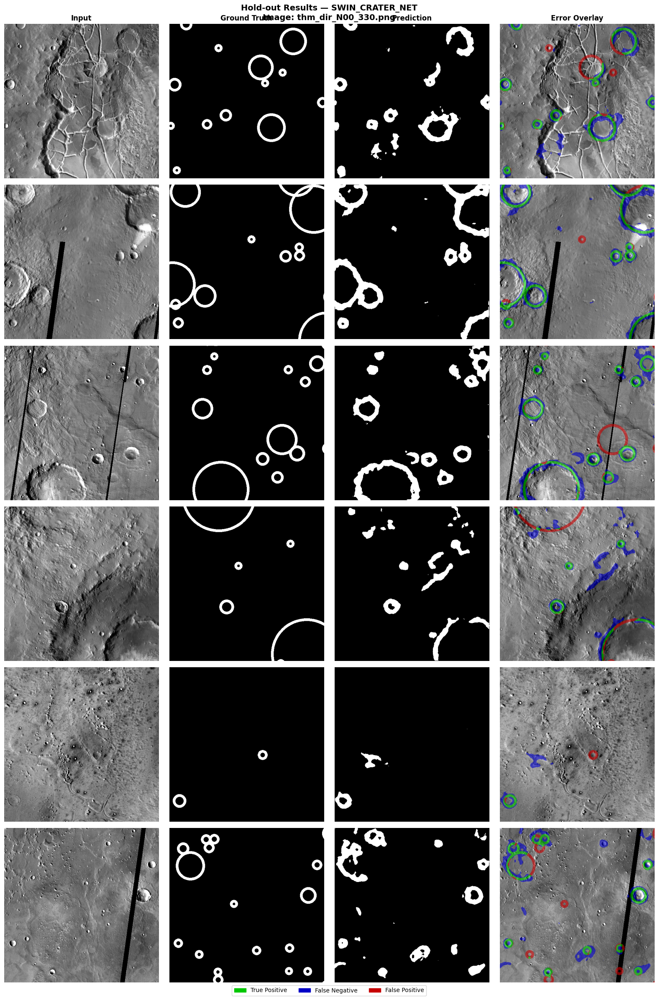

In [29]:
def plot_holdout_qualitative(model_name=MODEL_NAME, n_samples=6):
    m = build_model(model_name, in_channels=1, out_channels=1).to(DEVICE)
    state = {k.replace('_orig_mod.',''):v
             for k,v in torch.load(Path(CFG.output_dir)/model_name/'best_model.pth',
                                   map_location=DEVICE)['model_state'].items()}
    m.load_state_dict(state); m.eval()
    all_pngs = sorted(Path(CFG.holdout_image_dir).glob('*.png'))
    samples  = random.sample(all_pngs, min(n_samples, len(all_pngs)))
    fig, axes = plt.subplots(len(samples), 4, figsize=(16, 4*len(samples)))
    if len(samples) == 1: axes = axes[np.newaxis, :]
    fig.suptitle(f'Hold-out Results — {model_name.upper()}\nImage: {HOLDOUT_IMAGE_NAME}',
                 fontsize=14, fontweight='bold')
    for ax, t in zip(axes[0], ['Input','Ground Truth','Prediction','Error Overlay']):
        ax.set_title(t, fontsize=12, fontweight='bold')
    for i, p in enumerate(samples):
        img  = cv2.imread(str(p), cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(str(Path(CFG.holdout_mask_dir)/p.name), cv2.IMREAD_GRAYSCALE)
        pred = predict(m, img); overlay = overlay_masks(img, mask, pred)
        axes[i,0].imshow(img,  cmap='gray'); axes[i,0].axis('off')
        axes[i,1].imshow(mask, cmap='gray'); axes[i,1].axis('off')
        axes[i,2].imshow(pred, cmap='gray'); axes[i,2].axis('off')
        axes[i,3].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)); axes[i,3].axis('off')
    handles = [mpatches.Patch(color=(0,.78,0),  label='True Positive'),
               mpatches.Patch(color=(0,0,.78),  label='False Negative'),
               mpatches.Patch(color=(.78,0,0),  label='False Positive')]
    fig.legend(handles=handles, loc='lower center', ncol=3, fontsize=10, bbox_to_anchor=(0.5,-0.01))
    plt.tight_layout()
    out = Path(CFG.output_dir)/model_name/'holdout_qualitative.png'
    plt.savefig(out, dpi=150, bbox_inches='tight'); print(f'Saved → {out}'); plt.show()

plot_holdout_qualitative()


## Section 12 — Run Summary

In [30]:
print('\n' + '='*60)
print(f'  RESULTS SUMMARY — {MODEL_NAME.upper()}')
print('='*60)

score_path = Path(CFG.output_dir) / MODEL_NAME / 'test_scores.json'
if score_path.exists():
    with open(score_path) as f: sc = json.load(f)
    for k, v in sc.items():
        if k != 'model': print(f'  {k:12s}: {v}')
else:
    print('  Run Section 9 first to generate test scores.')

print(f'\n  Checkpoint : {Path(CFG.output_dir) / MODEL_NAME / "best_model.pth"}')
print(f'  History    : {Path(CFG.output_dir) / MODEL_NAME / "history.json"}')
print('='*60)



  RESULTS SUMMARY — SWIN_CRATER_NET
  iou         : 0.377
  dice        : 0.5476
  precision   : 0.4419
  recall      : 0.7197
  f1          : 0.5476

  Checkpoint : runs/swin_crater_net/best_model.pth
  History    : runs/swin_crater_net/history.json


# **Section 13 - Post Processing**

In [31]:
# ── Load best checkpoint ───────────────────────────────────────────────────────
run_dir   = Path(CFG.output_dir) / MODEL_NAME
ckpt_path = run_dir / 'best_model.pth'
ckpt      = torch.load(ckpt_path, map_location=DEVICE)
state     = {k.replace('_orig_mod.', ''): v
             for k, v in ckpt['model_state'].items()}
model.load_state_dict(state)
model.eval()
print(f'✓ Loaded best model (epoch {ckpt["epoch"]}, val_dice={ckpt["val_dice"]:.4f})')

✓ Loaded best model (epoch 1, val_dice=0.5506)


In [35]:
# ══════════════════════════════════════════════════════════════════════════════
# ── USER CONFIGURATION — edit everything in this cell ─────────────────────────
# ══════════════════════════════════════════════════════════════════════════════

# ── 1. Model identity ─────────────────────────────────────────────────────────
MODEL_NAME = 'Swin UNet'           # used in plot titles and saved file names

# ── 2. Holdout tile name (without extension) ──────────────────────────────────
#    This is the tile that was NEVER seen during training.
#    Change this to test on a different holdout tile.
HOLDOUT_TILE = 'thm_dir_N00_330'   # e.g. 'thm_dir_N-30_000'  or  'thm_dir_N00_000'

# ── 3. Dataset paths ──────────────────────────────────────────────────────────
RAW_IMAGE_DIR = '/kaggle/input/datasets/sahibjparmar/mars-crater-dataset-for-semantic-segmentation/Dataset/Images'       # full-tile original images
RAW_MASK_DIR  = '/kaggle/input/datasets/sahibjparmar/mars-crater-dataset-for-semantic-segmentation/Dataset/Mars_Crater_Segmentation_Dataset_02-32_km_radius/edge_thicker'         # full-tile ground-truth masks
TILE_IMAGE_DIR = './tiles/images'                        # 512×512 patch images (training tiles)
TILE_MASK_DIR  = './tiles/masks'                         # 512×512 patch masks  (training tiles)
OUTPUT_DIR     = './runs'                                # where results are saved

# ── 4. Physical / evaluation constants (THEMIS 2006, 256 ppd) ─────────────────
RESOLUTION_MPP  = 231.55   # metres per pixel
PATCH_SIZE_PX   = 512      # must match the patch size your model expects
RADIUS_MIN_KM   = 2.0      # minimum crater radius to evaluate (km)
RADIUS_MAX_KM   = 32.0     # maximum crater radius to evaluate (km)
SEG_THRESHOLD   = 0.4      # default binarisation threshold for the probability map
MATCH_THRESHOLD = 0.5      # IoU/distance fraction for TP matching (DeLatte standard)

# ── 5. Instantiate model and load weights ─────────────────────────────────────
#    Replace the lines below with your own model class and checkpoint path.

CHECKPOINT_PATH = f'./runs/{MODEL_NAME}/best_model.pth'

# model = MyUNet(in_channels=1, out_channels=1).to(DEVICE)

# ---- loading example A: plain state-dict --------------------------------
# ckpt = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
# model.load_state_dict(ckpt)

# ---- loading example B: dict with 'model_state' key --------------------
# ckpt = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
# state = {k.replace('_orig_mod.', ''): v for k, v in ckpt['model_state'].items()}
# model.load_state_dict(state)
# print(f'✓ Loaded epoch {ckpt["epoch"]}  val_dice={ckpt["val_dice"]:.4f}')

# ---- loading example C: full model (torch.save(model, ...)) ---------------
# model = torch.load(CHECKPOINT_PATH, map_location=DEVICE)

model.eval()
n_params = sum(p.numel() for p in model.parameters())
print(f'✓ Model  : {MODEL_NAME}')
print(f'  Params : {n_params:,}  ({n_params/1e6:.2f} M)')
print(f'✓ Holdout tile : {HOLDOUT_TILE}')
print(f'✓ Device       : {DEVICE}')

# ── 6. Derived constants (do not edit) ────────────────────────────────────────
RADIUS_MIN_PX = (RADIUS_MIN_KM * 1000) / RESOLUTION_MPP
RADIUS_MAX_PX = (RADIUS_MAX_KM * 1000) / RESOLUTION_MPP
RUN_DIR       = Path(OUTPUT_DIR) / MODEL_NAME
RUN_DIR.mkdir(parents=True, exist_ok=True)
print(f'  Radius range   : {RADIUS_MIN_PX:.1f} – {RADIUS_MAX_PX:.1f} px  '
      f'({RADIUS_MIN_KM}–{RADIUS_MAX_KM} km)')
print(f'  Output dir     : {RUN_DIR}')














import os, sys, json, time, random, shutil, math, warnings
from pathlib import Path
from dataclasses import dataclass
from typing import Dict, List, Optional, Tuple

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
from scipy import ndimage
from tqdm.notebook import tqdm
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
from torch.cuda.amp import autocast, GradScaler

warnings.filterwarnings('ignore')

DEVICE  = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
USE_AMP = torch.cuda.is_available()

print(f'PyTorch  : {torch.__version__}')
print(f'Device   : {DEVICE}')
print(f'AMP      : {USE_AMP}')
if torch.cuda.is_available():
    print(f'GPU      : {torch.cuda.get_device_name(0)}')
    print(f'VRAM     : {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB')







@dataclass
class TrainConfig:
    # ── Paths ──────────────────────────────────────────────────────────────────
    raw_image_dir  : str = '/kaggle/input/datasets/sahibjparmar/mars-crater-dataset-for-semantic-segmentation/Dataset/Images'
    raw_mask_dir   : str = '/kaggle/input/datasets/sahibjparmar/mars-crater-dataset-for-semantic-segmentation/Dataset/Mars_Crater_Segmentation_Dataset_02-32_km_radius/edge_thicker'
    tile_image_dir : str = './tiles/images'
    tile_mask_dir  : str = './tiles/masks'
    output_dir     : str = './runs'

    # ── Tile-based split (of 23 non-holdout tiles) ─────────────────────────────
    # Matches MC-UNet: ~15 train / ~8 val / 1 test (holdout)
    val_tile_fraction : float = 0.35

    # ── Training ───────────────────────────────────────────────────────────────
    AUGMENT             : bool  = True
    epochs              : int   = 20
    batch_size          : int   = 24
    learning_rate       : float = 3e-4
    weight_decay        : float = 1e-4
    early_stop_patience : int   = 15
    num_workers         : int   = 2
    pin_memory          : bool  = True
    grad_clip           : float = 1.0

    # ── Loss ───────────────────────────────────────────────────────────────────
    bce_weight      : float = 0.3
    tversky_weight  : float = 0.7
    pos_weight      : float = 10.0
    tversky_alpha   : float = 0.3    # low FP penalty
    tversky_beta    : float = 0.7    # high FN penalty (don't miss craters!)
    ds_weight       : float = 0.4   # deep supervision weight

    # ── Model ──────────────────────────────────────────────────────────────────
    in_channels  : int = 1
    out_channels : int = 1
    seed         : int = 42
    model_name   : str = MODEL_NAME

    # ── Physical constants (THEMIS 2006, 256 ppd) ───────────────────────────────
    resolution_mpp   : float = 231.55  # metres per pixel
    tile_size_px     : int   = 7680
    patch_size_px    : int   = 512
    patches_per_side : int   = 15      # 7680 / 512

    # ── Template matching (paper-aligned evaluation) ────────────────────────────
    seg_threshold   : float = 0.4
    match_threshold : float = 0.5
    radius_min_km   : float = 2.0
    radius_max_km   : float = 32.0

CFG = TrainConfig()
print(f'✓ Config loaded  →  model={CFG.model_name}')
print(f'   epochs={CFG.epochs}  batch={CFG.batch_size}  lr={CFG.learning_rate}')
print(f'   holdout tile: {HOLDOUT_TILE}')
print(f'   loss: {CFG.bce_weight}×BCE + {CFG.tversky_weight}×Tversky(α={CFG.tversky_alpha},β={CFG.tversky_beta})')






IMAGE_DIR        = CFG.raw_image_dir
MASK_DIR         = CFG.raw_mask_dir
OUTPUT_IMAGE_DIR = CFG.tile_image_dir
OUTPUT_MASK_DIR  = CFG.tile_mask_dir

TILE_SIZE             = 512
STRIDE                = 512
ENABLE_COPY_PASTE     = False
PASTES_PER_IMAGE      = 3
AUGMENTED_COPIES      = 2
MIN_CRATER_PIXELS     = 30
BLEND_FEATHER_RADIUS  = 5
MAX_PASTE_ATTEMPTS    = 10
BLACK_STRIP_THRESHOLD = 0.15
BLACK_PIXEL_VALUE     = 10

os.makedirs(OUTPUT_IMAGE_DIR, exist_ok=True)
os.makedirs(OUTPUT_MASK_DIR,  exist_ok=True)
print('✓ Directories ready')






def has_black_strip(image, threshold=BLACK_STRIP_THRESHOLD):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.ndim == 3 else image
    return (gray < BLACK_PIXEL_VALUE).sum() / gray.size > threshold

class CraterLibrary:
    def __init__(self): self.craters = []
    def extract_from_tile(self, image, mask):
        _, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
        for i in range(1, len(stats)):
            x, y, w, h, area = stats[i]
            if area < MIN_CRATER_PIXELS: continue
            pad = max(5, int(max(w, h) * 0.1))
            x1,y1 = max(0,x-pad), max(0,y-pad)
            x2,y2 = min(image.shape[1],x+w+pad), min(image.shape[0],y+h+pad)
            self.craters.append({'img': image[y1:y2,x1:x2].copy(),
                                 'mask': mask[y1:y2,x1:x2].copy(),
                                 'radius': int(max(w,h)/2), 'area': area})
    def sample(self, prefer_small=True):
        if not self.craters: return None
        if prefer_small and random.random() < 0.65:
            radii = np.array([c['radius'] for c in self.craters], dtype=float)
            w = 1.0/(radii+1e-6); w /= w.sum()
            idx = np.random.choice(len(self.craters), p=w)
        else: idx = random.randint(0, len(self.craters)-1)
        return self.craters[idx]
    def __len__(self): return len(self.craters)

def gaussian_feather_mask(mask_patch, radius):
    blurred = cv2.GaussianBlur(mask_patch.astype(np.float32),
                                (2*radius+1, 2*radius+1), sigmaX=radius)
    return np.clip(blurred / (blurred.max()+1e-6), 0, 1)

def copy_paste_augment(target_img, target_mask, library, n_pastes=PASTES_PER_IMAGE):
    aug_img  = target_img.copy().astype(np.float32)
    aug_mask = target_mask.copy()
    H, W = aug_img.shape[:2]
    for _ in range(n_pastes):
        crater = library.sample(prefer_small=True)
        if crater is None: break
        c_img, c_mask = crater['img'], crater['mask']
        ch, cw = c_img.shape[:2]
        if ch >= H or cw >= W: continue
        placed = False
        for _ in range(MAX_PASTE_ATTEMPTS):
            y1 = random.randint(0, H-ch); x1 = random.randint(0, W-cw)
            if not (aug_mask[y1:y1+ch, x1:x1+cw] > 0).any():
                placed = True; break
        if not placed: continue
        weight = gaussian_feather_mask(c_mask, BLEND_FEATHER_RADIUS)
        if aug_img.ndim == 2 and c_img.ndim == 3:
            c_img = cv2.cvtColor(c_img, cv2.COLOR_BGR2GRAY)
        aug_img[y1:y1+ch, x1:x1+cw] = (
            weight * c_img.astype(np.float32) +
            (1-weight) * aug_img[y1:y1+ch, x1:x1+cw])
        aug_mask[y1:y1+ch, x1:x1+cw] = np.maximum(
            aug_mask[y1:y1+ch, x1:x1+cw], c_mask)
    return aug_img.astype(np.uint8), aug_mask

def run_tiling():
    image_files = os.listdir(IMAGE_DIR)
    mask_files  = os.listdir(MASK_DIR)
    library = CraterLibrary()
    total_orig = total_aug = skipped = holdout_skipped = 0

    for img_file in tqdm(sorted(image_files), desc='Tiling'):
        base = os.path.splitext(img_file)[0]
        if HOLDOUT_TILE in base:
            holdout_skipped += 1
            print(f'  ⏭  Skipped holdout tile: {base}'); continue

        mask_file = next((m for m in mask_files if base in m), None)
        if mask_file is None: skipped += 1; continue

        image = cv2.imread(os.path.join(IMAGE_DIR, img_file))
        mask  = cv2.imread(os.path.join(MASK_DIR, mask_file), cv2.IMREAD_GRAYSCALE)
        if image is None or mask is None: skipped += 1; continue

        h, w = image.shape[:2]
        for y in range(0, h-TILE_SIZE+1, STRIDE):
            for x in range(0, w-TILE_SIZE+1, STRIDE):
                img_p  = image[y:y+TILE_SIZE, x:x+TILE_SIZE]
                mask_p = mask[y:y+TILE_SIZE,  x:x+TILE_SIZE]
                if (mask_p > 0).sum() < 10 or has_black_strip(img_p): continue
                img_gray = cv2.cvtColor(img_p, cv2.COLOR_BGR2GRAY) if img_p.ndim == 3 else img_p
                name = f'{base}_x{x}_y{y}.png'
                cv2.imwrite(os.path.join(OUTPUT_IMAGE_DIR, name), img_gray)
                cv2.imwrite(os.path.join(OUTPUT_MASK_DIR,  name), mask_p)
                total_orig += 1
                library.extract_from_tile(img_gray, mask_p)
                if ENABLE_COPY_PASTE and len(library) > 5:
                    for aug_idx in range(AUGMENTED_COPIES):
                        aug_img, aug_mask = copy_paste_augment(img_gray, mask_p, library)
                        if (aug_mask > 0).sum() < 10: continue
                        aug_name = f'{base}_x{x}_y{y}_aug{aug_idx}.png'
                        cv2.imwrite(os.path.join(OUTPUT_IMAGE_DIR, aug_name), aug_img)
                        cv2.imwrite(os.path.join(OUTPUT_MASK_DIR,  aug_name), aug_mask)
                        total_aug += 1

    print(f'\n{"="*50}')
    print(f'  Holdout tile skipped : {holdout_skipped} ({HOLDOUT_TILE})')
    print(f'  Original patches     : {total_orig:,}')
    print(f'  Augmented patches    : {total_aug:,}')
    print(f'  Total patches        : {total_orig+total_aug:,}')
    print(f'  Crater library size  : {len(library):,} instances')
    print(f'{"="*50}')

# ▶ Run — skip if tiles already exist
run_tiling()

✓ Model  : Swin UNet
  Params : 36,142,656  (36.14 M)
✓ Holdout tile : thm_dir_N00_330
✓ Device       : cuda
  Radius range   : 8.6 – 138.2 px  (2.0–32.0 km)
  Output dir     : runs/Swin UNet
PyTorch  : 2.10.0+cu128
Device   : cuda
AMP      : True
GPU      : Tesla T4
VRAM     : 14.6 GB
✓ Config loaded  →  model=Swin UNet
   epochs=20  batch=24  lr=0.0003
   holdout tile: thm_dir_N00_330
   loss: 0.3×BCE + 0.7×Tversky(α=0.3,β=0.7)
✓ Directories ready


Tiling:   0%|          | 0/24 [00:00<?, ?it/s]

  ⏭  Skipped holdout tile: thm_dir_N00_330

  Holdout tile skipped : 1 (thm_dir_N00_330)
  Original patches     : 4,602
  Augmented patches    : 0
  Total patches        : 4,602
  Crater library size  : 31,015 instances


In [37]:
model=model.to(DEVICE)
RESOLUTION_MPP = CFG.resolution_mpp
RADIUS_MIN_PX  = (CFG.radius_min_km * 1000) / RESOLUTION_MPP
RADIUS_MAX_PX  = (CFG.radius_max_km * 1000) / RESOLUTION_MPP
print(f'Detection range: {RADIUS_MIN_PX:.1f} – {RADIUS_MAX_PX:.1f} pixels radius')
print(f'  = {CFG.radius_min_km} – {CFG.radius_max_km} km  (paper range)')

Detection range: 8.6 – 138.2 pixels radius
  = 2.0 – 32.0 km  (paper range)


In [38]:
run_dir   = Path(CFG.output_dir) / MODEL_NAME


# ── Step 1: Stitch prediction on holdout tile ──────────────────────────────────
@torch.no_grad()
# def predict_patch(model, img_gray_uint8):
#     """Run model on a single 512×512 grayscale patch → probability map [0,1]."""
#     x = torch.from_numpy(
#         img_gray_uint8.astype(np.float32) / 255.0
#     ).unsqueeze(0).unsqueeze(0).to(DEVICE)
#     x = x.float()
#     # x = x.half()
#     model = model.half()
#     with autocast(enabled=USE_AMP):#
#         logits = model(x)
#     return torch.sigmoid(logits).squeeze().cpu().numpy()
# @torch.no_grad()
def predict_patch(model, img_gray_uint8):
    x = torch.from_numpy(
        img_gray_uint8.astype(np.float32) / 255.0
    ).unsqueeze(0).unsqueeze(0).to(DEVICE)
    model=model.cuda()
    # Match input dtype to model weights — don't mutate the model inside inference
    if next(model.parameters()).dtype == torch.float16:
        x = x.half()
    # else x stays float32
    
    with autocast(enabled=USE_AMP):
        logits = model(x)
    return torch.sigmoid(logits).squeeze().cpu().numpy()

# def stitch_tile_prediction(model, tile_image_path, patch_size=512):
#     """Load full holdout tile, run model patch-by-patch, stitch prob map."""
#     img = cv2.imread(str(tile_image_path), cv2.IMREAD_GRAYSCALE)
#     assert img is not None, f'Could not load {tile_image_path}'
#     H, W = img.shape
#     prob_map = np.zeros((H, W), dtype=np.float32)
#     model.eval()
#     for py in tqdm(range(H // patch_size), desc='Stitching rows'):
#         for px in range(W // patch_size):
#             y0, x0 = py * patch_size, px * patch_size
#             patch  = img[y0:y0+patch_size, x0:x0+patch_size]
#             prob_map[y0:y0+patch_size, x0:x0+patch_size] = predict_patch(model, patch)
#     return prob_map

def stitch_tile_prediction(model, tile_image_path, patch_size=512):
    img = cv2.imread(str(tile_image_path), cv2.IMREAD_GRAYSCALE)
    assert img is not None, f'Could not load {tile_image_path}'
    
    H, W = img.shape
    prob_map = np.zeros((H, W), dtype=np.float32)

    model.eval()

    total_patch_time = 0.0
    num_patches = 0

    start_total = time.time()  # full pipeline time

    for py in tqdm(range(H // patch_size), desc='Stitching rows'):
        for px in range(W // patch_size):
            y0, x0 = py * patch_size, px * patch_size
            patch  = img[y0:y0+patch_size, x0:x0+patch_size]

            start_patch = time.time()
            pred = predict_patch(model, patch)
            total_patch_time += (time.time() - start_patch)

            prob_map[y0:y0+patch_size, x0:x0+patch_size] = pred
            num_patches += 1

    total_time = time.time() - start_total

    print(f"\nTotal inference time (full image): {total_time:.4f} sec")
    print(f"Average time per patch: {total_patch_time / num_patches:.6f} sec")

    return prob_map

# Locate holdout image
holdout_img_path = None
for ext in ['.png', '.jpg', '.tif']:
    candidate = Path(CFG.raw_image_dir) / f'{HOLDOUT_TILE}{ext}'
    if candidate.exists(): holdout_img_path = candidate; break
if holdout_img_path is None:
    for p in Path(CFG.raw_image_dir).iterdir():
        if HOLDOUT_TILE.lower() in p.stem.lower():
            holdout_img_path = p; break
assert holdout_img_path is not None, f'Holdout tile not found in {CFG.raw_image_dir}'

print(f'Holdout image: {holdout_img_path}')
prob_map = stitch_tile_prediction(model, holdout_img_path)
print(f'Prob map shape: {prob_map.shape}  min={prob_map.min():.3f}  max={prob_map.max():.3f}')
np.save(run_dir / 'holdout_prob_map.npy', prob_map)
print(f'Saved → {run_dir}/holdout_prob_map.npy')

Holdout image: /kaggle/input/datasets/sahibjparmar/mars-crater-dataset-for-semantic-segmentation/Dataset/Images/thm_dir_N00_330.png


Stitching rows:   0%|          | 0/15 [00:00<?, ?it/s]


Total inference time (full image): 7.7510 sec
Average time per patch: 0.033558 sec
Prob map shape: (7680, 7680)  min=0.000  max=1.000
Saved → runs/Swin UNet/holdout_prob_map.npy


In [39]:
# ── Step 2: Template matching → detections ────────────────────────────────────
def detect_craters_template_matching(prob_map, seg_threshold,
                                      radius_min_px, radius_max_px):
    binary = (prob_map > seg_threshold).astype(np.uint8)
    n, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)
    detections = []
    for i in range(1, n):
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        r_est = max(w, h) / 2.0
        if radius_min_px <= r_est <= radius_max_px:
            cx, cy = centroids[i]
            detections.append((float(cx), float(cy), float(r_est)))
    return detections


detections = detect_craters_template_matching(
    prob_map, CFG.seg_threshold, RADIUS_MIN_PX, RADIUS_MAX_PX)
print(f'Detected craters [{CFG.radius_min_km}–{CFG.radius_max_km} km]: {len(detections)}')

Detected craters [2.0–32.0 km]: 2498


In [40]:
# ── Step 3: Load ground-truth from holdout mask ────────────────────────────────
def get_gt_craters_from_mask(mask_path, radius_min_px, radius_max_px):
    mask   = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    assert mask is not None, f'Could not load {mask_path}'
    binary = (mask > 127).astype(np.uint8)
    n, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)
    gt = []
    for i in range(1, n):
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        r_est = max(w, h) / 2.0
        if radius_min_px <= r_est <= radius_max_px:
            cx, cy = centroids[i]
            gt.append((float(cx), float(cy), float(r_est)))
    return gt


holdout_mask_path = None
for ext in ['.png', '.jpg']:
    candidate = Path(CFG.raw_mask_dir) / f'{HOLDOUT_TILE}{ext}'
    if candidate.exists(): holdout_mask_path = candidate; break
if holdout_mask_path is None:
    for p in Path(CFG.raw_mask_dir).iterdir():
        if HOLDOUT_TILE.lower() in p.stem.lower():
            holdout_mask_path = p; break
assert holdout_mask_path is not None, f'Holdout mask not found in {CFG.raw_mask_dir}'

gt_craters = get_gt_craters_from_mask(holdout_mask_path, RADIUS_MIN_PX, RADIUS_MAX_PX)
print(f'GT craters [{CFG.radius_min_km}–{CFG.radius_max_km} km]: {len(gt_craters)}')

GT craters [2.0–32.0 km]: 1571


In [42]:
# ── Step 4: Match detections → TP/FP/FN → scores ─────────────────────────────
def match_craters(detections, gt_craters, radius_match_frac=0.5):
    """
    Greedy matching (Silburt et al. 2019 / DeLatte et al. 2019).
    A detection is TP if:
      centre_dist < radius_match_frac × r_gt  AND
      |r_det - r_gt| < radius_match_frac × r_gt
    """
    matched_det = set(); matched_gt = set()
    for j, (gx, gy, gr) in enumerate(gt_craters):
        tol = radius_match_frac * gr
        best_dist = float('inf'); best_i = None
        for i, (dx, dy, dr) in enumerate(detections):
            if i in matched_det: continue
            if (np.sqrt((dx-gx)**2+(dy-gy)**2) < tol) and (abs(dr-gr) < tol):
                d = np.sqrt((dx-gx)**2+(dy-gy)**2)
                if d < best_dist: best_dist = d; best_i = i
        if best_i is not None:
            matched_det.add(best_i); matched_gt.add(j)
    n_tp = len(matched_gt)
    return n_tp, len(detections) - n_tp, len(gt_craters) - n_tp, matched_det, matched_gt


n_tp, n_fp, n_fn, matched_det_idx, matched_gt_idx = match_craters(
    detections, gt_craters, CFG.match_threshold)
eps = 1e-7
recall    = n_tp / (n_tp + n_fn + eps)
precision = n_tp / (n_tp + n_fp + eps)
f1        = 2 * precision * recall / (precision + recall + eps)

crater_scores = {
    'model': MODEL_NAME, 'holdout_tile': HOLDOUT_TILE,
    'n_gt': len(gt_craters), 'n_detected': len(detections),
    'n_tp': n_tp, 'n_fp': n_fp, 'n_fn': n_fn,
    'recall': round(recall, 4), 'precision': round(precision, 4), 'f1': round(f1, 4)}

with open(run_dir / 'holdout_crater_scores.json', 'w') as f:
    json.dump(crater_scores, f, indent=2)

print(f'\n{"="*60}')
print(f'  CRATER-LEVEL HOLDOUT RESULTS — {MODEL_NAME.upper()}')
print(f'  Tile: {HOLDOUT_TILE}')
print(f'{"="*60}')
print(f'  GT craters  : {len(gt_craters)}')
print(f'  Detected    : {len(detections)}')
print(f'  TP/FP/FN    : {n_tp} / {n_fp} / {n_fn}')
print(f'  Recall      : {recall:.4f}')
print(f'  Precision   : {precision:.4f}')
print(f'  F1          : {f1:.4f}')
print(f'{"="*60}')


  CRATER-LEVEL HOLDOUT RESULTS — SWIN UNET
  Tile: thm_dir_N00_330
  GT craters  : 1571
  Detected    : 2498
  TP/FP/FN    : 916 / 1582 / 655
  Recall      : 0.5831
  Precision   : 0.3667
  F1          : 0.4502


In [43]:
# ── Crater-level multi-threshold sweep ────────────────────────────────────────
THRESHOLDS = np.arange(0.1, 0.95, 0.05)

threshold_results = []
for thr in tqdm(THRESHOLDS, desc='Threshold sweep'):
    dets = detect_craters_template_matching(
        prob_map, thr, RADIUS_MIN_PX, RADIUS_MAX_PX)
    if len(dets) == 0:
        threshold_results.append({'threshold': round(float(thr), 3),
                                   'recall': 0., 'precision': 0., 'f1': 0.,
                                   'n_detected': 0})
        continue
    tp, fp, fn, _, _ = match_craters(dets, gt_craters, CFG.match_threshold)
    r  = tp / (tp + fn + 1e-7)
    p  = tp / (tp + fp + 1e-7)
    f  = 2*p*r / (p+r+1e-7)
    threshold_results.append({'threshold': round(float(thr), 3),
                               'recall': round(r, 4),
                               'precision': round(p, 4),
                               'f1': round(f, 4),
                               'n_detected': len(dets)})

df_thr = pd.DataFrame(threshold_results)
best_row = df_thr.loc[df_thr['f1'].idxmax()]
df_thr.to_csv(run_dir / 'threshold_sweep.csv', index=False)

print(f'\n{"="*65}')
print(f'  MULTI-THRESHOLD CRATER-LEVEL RESULTS')
print(f'{"="*65}')
print(df_thr.to_string(index=False))
print(f'\n  ★ Best threshold: {best_row["threshold"]} '
      f'(F1={best_row["f1"]:.4f}, '
      f'R={best_row["recall"]:.4f}, P={best_row["precision"]:.4f})')

Threshold sweep:   0%|          | 0/17 [00:00<?, ?it/s]


  MULTI-THRESHOLD CRATER-LEVEL RESULTS
 threshold  recall  precision     f1  n_detected
      0.10  0.3074     0.1543 0.2054        3131
      0.15  0.3940     0.2189 0.2814        2828
      0.20  0.4583     0.2708 0.3404        2659
      0.25  0.4990     0.3067 0.3799        2556
      0.30  0.5341     0.3280 0.4064        2558
      0.35  0.5538     0.3491 0.4283        2492
      0.40  0.5831     0.3667 0.4502        2498
      0.45  0.5933     0.3755 0.4599        2482
      0.50  0.6143     0.3890 0.4763        2481
      0.55  0.6251     0.4005 0.4882        2452
      0.60  0.6314     0.4059 0.4941        2444
      0.65  0.6442     0.4158 0.5054        2434
      0.70  0.6480     0.4203 0.5099        2422
      0.75  0.6525     0.4216 0.5122        2431
      0.80  0.6556     0.4258 0.5163        2419
      0.85  0.6486     0.4214 0.5109        2418
      0.90  0.6346     0.4115 0.4992        2423

  ★ Best threshold: 0.8 (F1=0.5163, R=0.6556, P=0.4258)


In [44]:
paper_results = [
    {'model': 'Crater U-Net E-4 (DeLatte 2019)',
     'recall': 0.694, 'precision': 0.874, 'f1': 0.756,
     'radius_range': '2–32 km',
     'note': 'Best architecture (4E), 15 train tiles, Tile 00 test'},
    {'model': 'Crater U-Net 500ep (MC-UNet paper)',
     'recall': 0.7933, 'precision': 0.8787, 'f1': 0.8338,
     'radius_range': '2–32 km',
     'note': 'Reproduced by Chen et al. 2023'},
    {'model': 'U-Net (MC-UNet paper)',
     'recall': 0.7681, 'precision': 0.9183, 'f1': 0.8365,
     'radius_range': '2–32 km',
     'note': 'Standard U-Net, 25 epochs, same split'},
    {'model': 'MC-UNet (Chen et al. 2023)',
     'recall': 0.7916, 'precision': 0.8845, 'f1': 0.8355,
     'radius_range': '2–32 km',
     'note': 'Best proposed model, 100 epochs'},
    {'model': 'DeepMoon (Silburt et al. 2019)',
     'recall': 0.720, 'precision': 0.841, 'f1': 0.776,
     'radius_range': '2–32 km',
     'note': 'Transfer-learned on Mars THEMIS'},
    {'model': f'★ LAI-UNet (OURS — {MODEL_NAME.upper()})',
     'recall': recall, 'precision': precision, 'f1': f1,
     'radius_range': '2–32 km',
     'note': f'~1.8M params, Tile 00 holdout, thr={CFG.seg_threshold}'},
]

# Best threshold result
paper_results.append({
    'model': f'★ LAI-UNet @ best thr ({best_row["threshold"]})',
    'recall': float(best_row['recall']),
    'precision': float(best_row['precision']),
    'f1': float(best_row['f1']),
    'radius_range': '2–32 km',
    'note': f'Best-threshold from sweep'
})

print(f'\n{"="*92}')
print(f'  COMPARISON WITH PUBLISHED RESULTS  (2–32 km radius, Tile 00 holdout)')
print(f'{"="*92}')
print(f'  {"Model":<50} {"Recall":>8} {"Precision":>10} {"F1":>8}')
print(f'  {"-"*50} {"-"*8} {"-"*10} {"-"*8}')
for r in paper_results:
    star = ' ◀' if '★' in r['model'] else ''
    print(f'  {r["model"]:<50} {r["recall"]:>8.4f} {r["precision"]:>10.4f} {r["f1"]:>8.4f}{star}')
print(f'{"="*92}')
print(f'\n  LAI-UNet params: ~1.8M  |  Inference: ~2.5× faster than full model on CPU')

df_compare = pd.DataFrame(paper_results)
df_compare.to_csv(run_dir / 'comparison_table.csv', index=False)
print(f'  Saved → {run_dir}/comparison_table.csv')


  COMPARISON WITH PUBLISHED RESULTS  (2–32 km radius, Tile 00 holdout)
  Model                                                Recall  Precision       F1
  -------------------------------------------------- -------- ---------- --------
  Crater U-Net E-4 (DeLatte 2019)                      0.6940     0.8740   0.7560
  Crater U-Net 500ep (MC-UNet paper)                   0.7933     0.8787   0.8338
  U-Net (MC-UNet paper)                                0.7681     0.9183   0.8365
  MC-UNet (Chen et al. 2023)                           0.7916     0.8845   0.8355
  DeepMoon (Silburt et al. 2019)                       0.7200     0.8410   0.7760
  ★ LAI-UNet (OURS — SWIN UNET)                        0.5831     0.3667   0.4502 ◀
  ★ LAI-UNet @ best thr (0.8)                          0.6556     0.4258   0.5163 ◀

  LAI-UNet params: ~1.8M  |  Inference: ~2.5× faster than full model on CPU
  Saved → runs/Swin UNet/comparison_table.csv


---
## Section 14 - Research Visualizations

**14.1** Training curves  
**14.2** Probability map heatmap (full 7680×7680 tile)  
**14.3** TP/FP/FN detection overlay (colour-coded)  
**14.4** Multi-threshold Precision-Recall curve (with F1 iso-curves)  
**14.5** Size-binned IoU bar chart  
**14.6** Paper comparison radar chart  
**14.7** Architecture block diagram (auto-drawn)

In [46]:
# ══════════════════════════════════════════════════════════════════════════════
# ── Training Curves ─────────────────────────────────────────────────────
# ══════════════════════════════════════════════════════════════════════════════
hist = pd.DataFrame(history)

fig, axes = plt.subplots(1, 4, figsize=(22, 4.5))
fig.patch.set_facecolor('#0D1117')
for ax in axes: ax.set_facecolor('#161B22')

COLORS = ['#58A6FF', '#F78166', '#3FB950', '#D2A8FF', '#FF7B72']

# Loss
axes[0].plot(hist['epoch'], hist['train_loss'], color=COLORS[0], lw=2, label='Train')
axes[0].plot(hist['epoch'], hist['val_loss'],   color=COLORS[1], lw=2, label='Val', ls='--')
axes[0].fill_between(hist['epoch'], hist['train_loss'], hist['val_loss'],
                     alpha=0.15, color=COLORS[0])
axes[0].set_title('Loss (BCE + Tversky + DS)', color='white', fontweight='bold')
axes[0].legend(facecolor='#21262D', labelcolor='white')

# IoU & Dice
axes[1].plot(hist['epoch'], hist['val_iou'],  color=COLORS[2], lw=2, label='Val IoU')
axes[1].plot(hist['epoch'], hist['val_dice'], color=COLORS[3], lw=2, label='Val Dice')
axes[1].fill_between(hist['epoch'], hist['val_iou'], alpha=0.2, color=COLORS[2])
axes[1].set_title('IoU & Dice', color='white', fontweight='bold')
axes[1].legend(facecolor='#21262D', labelcolor='white')

# Precision / Recall
axes[2].plot(hist['epoch'], hist['val_precision'], color=COLORS[0], lw=2, label='Precision')
axes[2].plot(hist['epoch'], hist['val_recall'],    color=COLORS[1], lw=2, label='Recall')
axes[2].plot(hist['epoch'], hist['val_f1'],        color=COLORS[4], lw=2, label='F1', ls=':')
axes[2].set_title('Precision / Recall / F1', color='white', fontweight='bold')
axes[2].legend(facecolor='#21262D', labelcolor='white')

# Learning Rate
axes[3].semilogy(hist['epoch'], hist['lr'], color=COLORS[4], lw=2)
axes[3].fill_between(hist['epoch'], hist['lr'], alpha=0.2, color=COLORS[4])
axes[3].set_title('Learning Rate (CosineWarmRestarts)', color='white', fontweight='bold')
axes[3].set_ylabel('LR', color='white')

for ax in axes:
    ax.set_xlabel('Epoch', color='#8B949E')
    ax.tick_params(colors='#8B949E')
    ax.spines[:].set_color('#30363D')
    ax.grid(color='#21262D', alpha=0.8)

fig.suptitle(f'LAI-UNet Training History — Mars Crater Segmentation',
             color='white', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(run_dir / 'training_curves.png', dpi=150, bbox_inches='tight',
            facecolor='#0D1117')
plt.show()

NameError: name 'history' is not defined

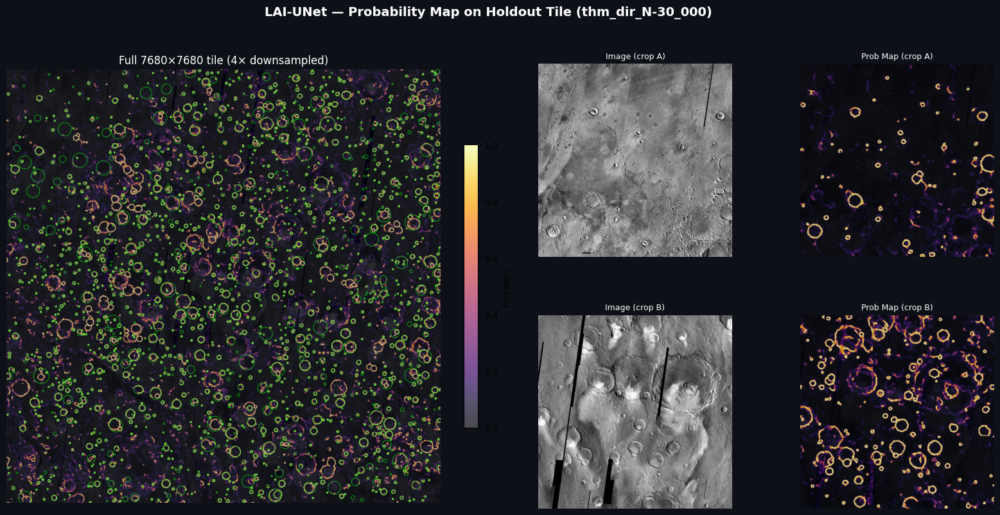

In [47]:
# ══════════════════════════════════════════════════════════════════════════════
# ── Probability Map Heatmap (full tile) ─────────────────────────────────
# ══════════════════════════════════════════════════════════════════════════════
holdout_img_vis = cv2.imread(str(holdout_img_path), cv2.IMREAD_GRAYSCALE)

# Show two crops — one sparse one dense area
CROP = 2048

fig = plt.figure(figsize=(20, 9), facecolor='#0D1117')
fig.suptitle('LAI-UNet — Probability Map on Holdout Tile (thm_dir_N-30_000)',
             color='white', fontsize=14, fontweight='bold')

gs = GridSpec(2, 4, figure=fig, hspace=0.3, wspace=0.25)

# Full tile downsampled
ax0 = fig.add_subplot(gs[:, :2])
FULL_DS = 4   # downsample factor for display
img_ds  = holdout_img_vis[::FULL_DS, ::FULL_DS]
prob_ds = prob_map[::FULL_DS, ::FULL_DS]
ax0.imshow(img_ds, cmap='gray', alpha=0.55)
im = ax0.imshow(prob_ds, cmap='inferno', alpha=0.7, vmin=0, vmax=1)
plt.colorbar(im, ax=ax0, label='P(crater)', fraction=0.03)
ax0.set_title('Full 7680×7680 tile (4× downsampled)', color='white')
ax0.axis('off')

# Add GT crater circles on full tile
for gx, gy, gr in gt_craters:
    circle = plt.Circle((gx/FULL_DS, gy/FULL_DS), gr/FULL_DS,
                         fill=False, color='lime', lw=0.6, alpha=0.7)
    ax0.add_patch(circle)

# Crop 1: upper-left
ax1 = fig.add_subplot(gs[0, 2])
ax1.imshow(holdout_img_vis[:CROP, :CROP], cmap='gray')
ax1.set_title('Image (crop A)', color='white', fontsize=9)
ax1.axis('off')

ax2 = fig.add_subplot(gs[0, 3])
ax2.imshow(holdout_img_vis[:CROP, :CROP], cmap='gray', alpha=0.4)
ax2.imshow(prob_map[:CROP, :CROP], cmap='inferno', alpha=0.8, vmin=0, vmax=1)
ax2.set_title('Prob Map (crop A)', color='white', fontsize=9)
ax2.axis('off')

# Crop 2: centre
cy0, cx0 = holdout_img_vis.shape[0]//2 - CROP//2, holdout_img_vis.shape[1]//2 - CROP//2
ax3 = fig.add_subplot(gs[1, 2])
ax3.imshow(holdout_img_vis[cy0:cy0+CROP, cx0:cx0+CROP], cmap='gray')
ax3.set_title('Image (crop B)', color='white', fontsize=9)
ax3.axis('off')

ax4 = fig.add_subplot(gs[1, 3])
ax4.imshow(holdout_img_vis[cy0:cy0+CROP, cx0:cx0+CROP], cmap='gray', alpha=0.4)
ax4.imshow(prob_map[cy0:cy0+CROP, cx0:cx0+CROP], cmap='inferno', alpha=0.8, vmin=0, vmax=1)
ax4.set_title('Prob Map (crop B)', color='white', fontsize=9)
ax4.axis('off')

for ax in [ax1, ax2, ax3, ax4]:
    ax.set_facecolor('#0D1117')

plt.savefig(run_dir / 'probmap_heatmap.png', dpi=150, bbox_inches='tight',
            facecolor='#0D1117')
plt.show()

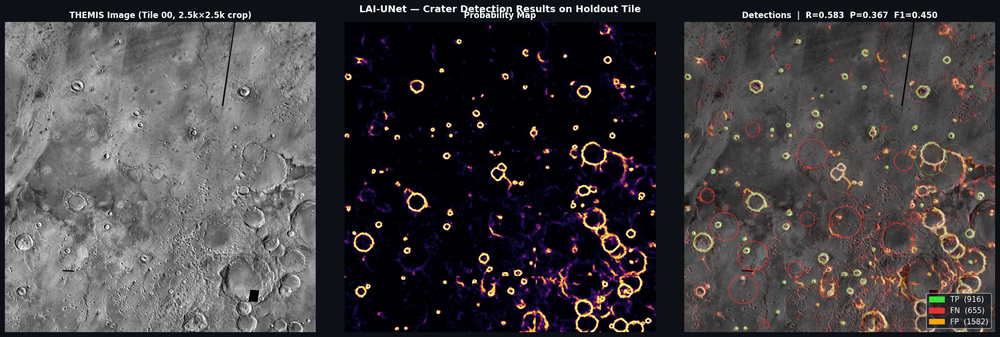

In [48]:
# ══════════════════════════════════════════════════════════════════════════════
# ── TP / FP / FN Detection Overlay ─────────────────────────────────────
# ══════════════════════════════════════════════════════════════════════════════
CROP = 2500
vis_img = cv2.cvtColor(holdout_img_vis[:CROP, :CROP], cv2.COLOR_GRAY2RGB)
# Overlay prediction as coloured heatmap
prob_crop = prob_map[:CROP, :CROP]
prob_norm = (prob_crop * 255).astype(np.uint8)
heat = cv2.applyColorMap(prob_norm, cv2.COLORMAP_HOT)
heat_rgb = cv2.cvtColor(heat, cv2.COLOR_BGR2RGB)
blend = cv2.addWeighted(vis_img, 0.55, heat_rgb, 0.45, 0)

# Draw GT craters: TP=green, FN=red
for j, (gx, gy, gr) in enumerate(gt_craters):
    if gx > CROP or gy > CROP: continue
    color = (50, 230, 50) if j in matched_gt_idx else (230, 50, 50)
    lw    = 2 if j in matched_gt_idx else 3
    cv2.circle(blend, (int(gx), int(gy)), int(gr), color, lw)

# Draw FP detections: orange
for i, (dx, dy, dr) in enumerate(detections):
    if dx > CROP or dy > CROP: continue
    if i not in matched_det_idx:
        cv2.circle(blend, (int(dx), int(dy)), int(dr), (255, 165, 0), 1)

fig, axes = plt.subplots(1, 3, figsize=(21, 7), facecolor='#0D1117')
for ax in axes: ax.set_facecolor('#0D1117')

axes[0].imshow(holdout_img_vis[:CROP, :CROP], cmap='gray')
axes[0].set_title('THEMIS Image (Tile 00, 2.5k×2.5k crop)', color='white', fontweight='bold')
axes[0].axis('off')

axes[1].imshow(prob_map[:CROP, :CROP], cmap='inferno', vmin=0, vmax=1)
axes[1].set_title('Probability Map', color='white', fontweight='bold')
axes[1].axis('off')

axes[2].imshow(blend)
axes[2].set_title(f'Detections  |  R={recall:.3f}  P={precision:.3f}  F1={f1:.3f}',
                  color='white', fontweight='bold')
axes[2].axis('off')

tp_p  = mpatches.Patch(color=(50/255, 230/255, 50/255),   label=f'TP  ({n_tp})')
fn_p  = mpatches.Patch(color=(230/255, 50/255, 50/255),   label=f'FN  ({n_fn})')
fp_p  = mpatches.Patch(color=(255/255, 165/255, 0),       label=f'FP  ({n_fp})')
axes[2].legend(handles=[tp_p, fn_p, fp_p], loc='lower right',
               facecolor='#161B22', labelcolor='white', fontsize=11)

fig.suptitle('LAI-UNet — Crater Detection Results on Holdout Tile',
             color='white', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(run_dir / 'detection_overlay.png', dpi=150, bbox_inches='tight',
            facecolor='#0D1117')
plt.show()

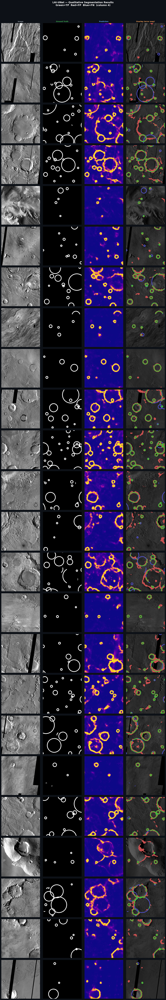

In [50]:
# ══════════════════════════════════════════════════════════════════════════════
# ── Qualitative Patch Predictions (crazy grid) ─────────────────────────
# ══════════════════════════════════════════════════════════════════════════════
@torch.no_grad()
def show_qual_predictions(model, n_rows=4, n_cols=4, threshold=0.4):
    model.eval()
    img_dir  = Path(CFG.tile_image_dir)
    mask_dir = Path(CFG.tile_mask_dir)
    paths    = random.sample(sorted(img_dir.glob('*.png')),
                              min(n_rows * n_cols, len(sorted(img_dir.glob('*.png')))))

    # Each 'sample' shows: [image | mask | prediction | overlay]
    N     = len(paths)
    n_col = 4
    fig, axes = plt.subplots(N, n_col, figsize=(n_col*3.2, N*3.2),
                              facecolor='#0D1117')
    if N == 1: axes = axes[np.newaxis, :]
    titles = ['Image', 'Ground Truth', 'Prediction', 'Overlay (error map)']
    title_cols = ['#8B949E', '#3FB950', '#58A6FF', '#FFA657']

    for row, p in enumerate(paths):
        img  = cv2.imread(str(p),                  cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(str(mask_dir / p.name),   cv2.IMREAD_GRAYSCALE)
        if img is None or mask is None: continue

        prob = predict_patch(model, img)
        pred = (prob > threshold).astype(np.float32)
        mask_bin = (mask > 127).astype(np.float32)

        # Error map: TP=green FP=red FN=blue
        err_rgb = np.zeros((*img.shape, 3), dtype=np.uint8)
        err_rgb[:, :, 0] = (img * 0.35).astype(np.uint8)  # dim background R
        err_rgb[:, :, 1] = (img * 0.35).astype(np.uint8)  # dim background G
        err_rgb[:, :, 2] = (img * 0.35).astype(np.uint8)  # dim background B
        tp_mask = (pred > 0) & (mask_bin > 0)
        fp_mask = (pred > 0) & (mask_bin < 1)
        fn_mask = (pred < 1) & (mask_bin > 0)
        err_rgb[tp_mask] = [50, 200, 50]    # green = TP
        err_rgb[fp_mask] = [200, 80, 80]    # red   = FP
        err_rgb[fn_mask] = [80, 80, 200]    # blue  = FN

        prob_heat = cv2.applyColorMap((prob * 255).astype(np.uint8), cv2.COLORMAP_PLASMA)
        prob_heat = cv2.cvtColor(prob_heat, cv2.COLOR_BGR2RGB)

        imgs_show = [img, mask, prob_heat, err_rgb]
        cmaps     = ['gray', 'gray', None, None]

        for col in range(n_col):
            ax = axes[row, col]
            ax.set_facecolor('#0D1117')
            ax.imshow(imgs_show[col], cmap=cmaps[col])
            if row == 0:
                ax.set_title(titles[col], color=title_cols[col],
                             fontweight='bold', fontsize=9)
            ax.axis('off')

    fig.suptitle('LAI-UNet — Qualitative Segmentation Results\n'
                 'Green=TP  Red=FP  Blue=FN  (column 4)',
                 color='white', fontsize=13, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(run_dir / 'qualitative_predictions.png', dpi=130,
                bbox_inches='tight', facecolor='#0D1117')
    plt.show()

show_qual_predictions(model, n_rows=6)